# Statistics for Michel electron candidate (PDHD MC production New202510)

### Created by Shu

#### To explore decay points distribution asymmetry along drift direction

#### (20251001) Main update here is the introduction of CLASS, to upgrade current cumbersome data processing

<br />
<br />
<br />
<br />
<br />
<br />
<br />
<br />

## Initial candidates:

In [2]:
from dataclasses import dataclass

@dataclass
class ParticleEvent:
    decayX_initial: float = None
    decayY_initial: float = None
    decayZ_initial: float = None
    startX_initial: float = None
    startY_initial: float = None
    startZ_initial: float = None
    MS_initial: float = None
    MH_initial: float = None
    energy_initial: float = None
    lifetime_initial: float = None
    pdg_initial: int = None


def read_values(file_path, cast_type=float):
    values = []
    with open(file_path, 'r') as filehandle:
        for line in filehandle:
            value = line.strip()
            if value:
                values.append(cast_type(value))
    return values


def read_multiple(files, cast_type=float):
    """Read multiple text files in sequence and combine into one list."""
    values = []
    for f in files:
        values.extend(read_values(f, cast_type=cast_type))
    return values


# --- Updated multiple-file reading (all in ./statResult) ---

decayX_initial = read_multiple([
    './statResult/decayX_New20251001_initial.txt',
    './statResult/decayX_New20251002_initial.txt'
])

decayY_initial = read_multiple([
    './statResult/decayY_New20251001_initial.txt',
    './statResult/decayY_New20251002_initial.txt'
])

decayZ_initial = read_multiple([
    './statResult/decayZ_New20251001_initial.txt',
    './statResult/decayZ_New20251002_initial.txt'
])

startX_initial = read_multiple([
    './statResult/startX_New20251001_initial.txt',
    './statResult/startX_New20251002_initial.txt'
])

startY_initial = read_multiple([
    './statResult/startY_New20251001_initial.txt',
    './statResult/startY_New20251002_initial.txt'
])

startZ_initial = read_multiple([
    './statResult/startZ_New20251001_initial.txt',
    './statResult/startZ_New20251002_initial.txt'
])

MS_initial = read_multiple([
    './statResult/michelScore_New20251001_initial.txt',
    './statResult/michelScore_New20251002_initial.txt'
])

MH_initial = read_multiple([
    './statResult/michelHits_New20251001_initial.txt',
    './statResult/michelHits_New20251002_initial.txt'
])

energy_initial = read_multiple([
    './statResult/energy_New20251001_initial.txt',
    './statResult/energy_New20251002_initial.txt'
])

lifetime_initial = read_multiple([
    './statResult/lifetime_New20251001_initial.txt',
    './statResult/lifetime_New20251002_initial.txt'
])

pdg_initial = read_multiple([
    './statResult/pdg_New20251001_initial.txt',
    './statResult/pdg_New20251002_initial.txt'
], cast_type=int)




#initial total events---
events_reco = []
for i in range(len(decayX_initial)):
    event = ParticleEvent(
        decayX_initial = decayX_initial[i],
        decayY_initial = decayY_initial[i],
        decayZ_initial = decayZ_initial[i],
        startX_initial = startX_initial[i],
        startY_initial = startY_initial[i],
        startZ_initial = startZ_initial[i],
        MS_initial = MS_initial[i],
        MH_initial = MH_initial[i],
        energy_initial   = energy_initial[i],
        lifetime_initial = lifetime_initial[i],
        pdg_initial      = pdg_initial[i]
    )
    events_reco.append(event)


print("Candidates ( MH > 1e-9): ", len(events_reco))

print("\nExample: ")
print(events_reco[0].decayX_initial)
print(events_reco[0].energy_initial)
print(events_reco[0].pdg_initial)




#True Michel events----------
events_true = []
trueE_num = 0
trueL_num = 0
for ev in events_reco:
    if ev.energy_initial > 0:
        trueE_num += 1
        events_true.append(ev)
    if ev.lifetime_initial > 0:
        trueL_num += 1

print("\n# of True events: ", len(events_true))
print("Events with E > 0 (true Michel): ", trueE_num, "({:.2f}%)".format(trueE_num/len(events_reco)*100))
print("Events with L > 0 (true Michel): ", trueL_num, "({:.2f}%)".format(trueL_num/len(events_reco)*100))



Candidates ( MH > 1e-9):  79145

Example: 
-342.009
-1.0
0

# of True events:  8436
Events with E > 0 (true Michel):  8436 (10.66%)
Events with L > 0 (true Michel):  8436 (10.66%)



Decay points distribution: 
# of X < 0 :  42671 (53.91%)
# of X >= 0:  36474 (46.09%)


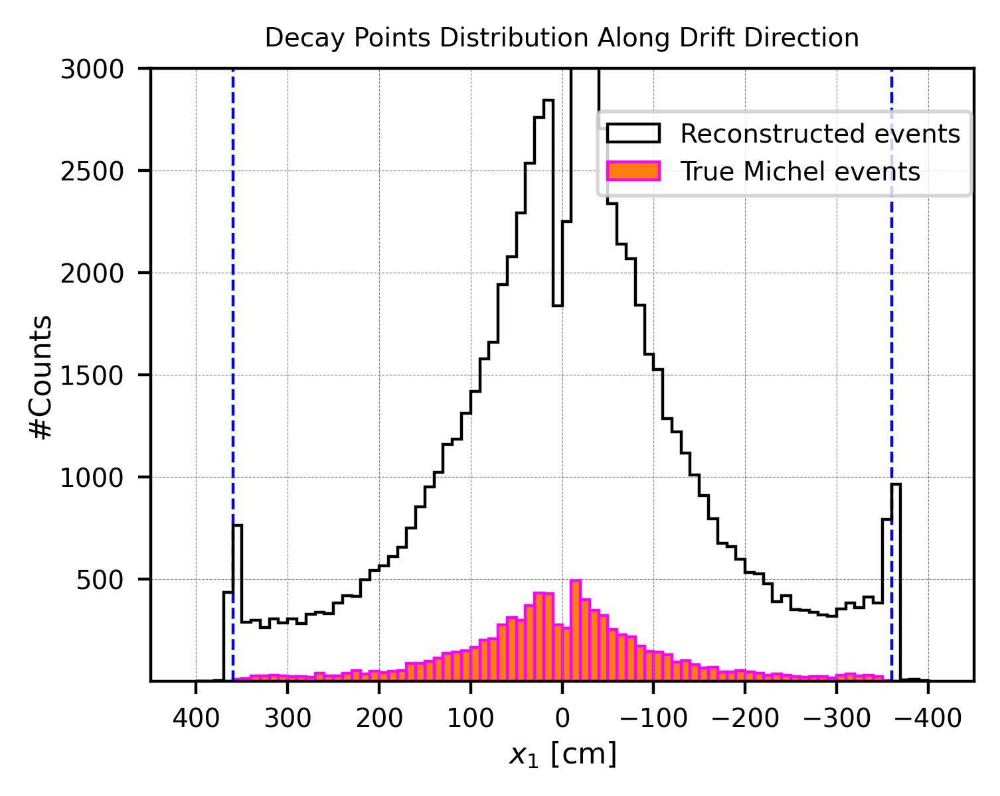

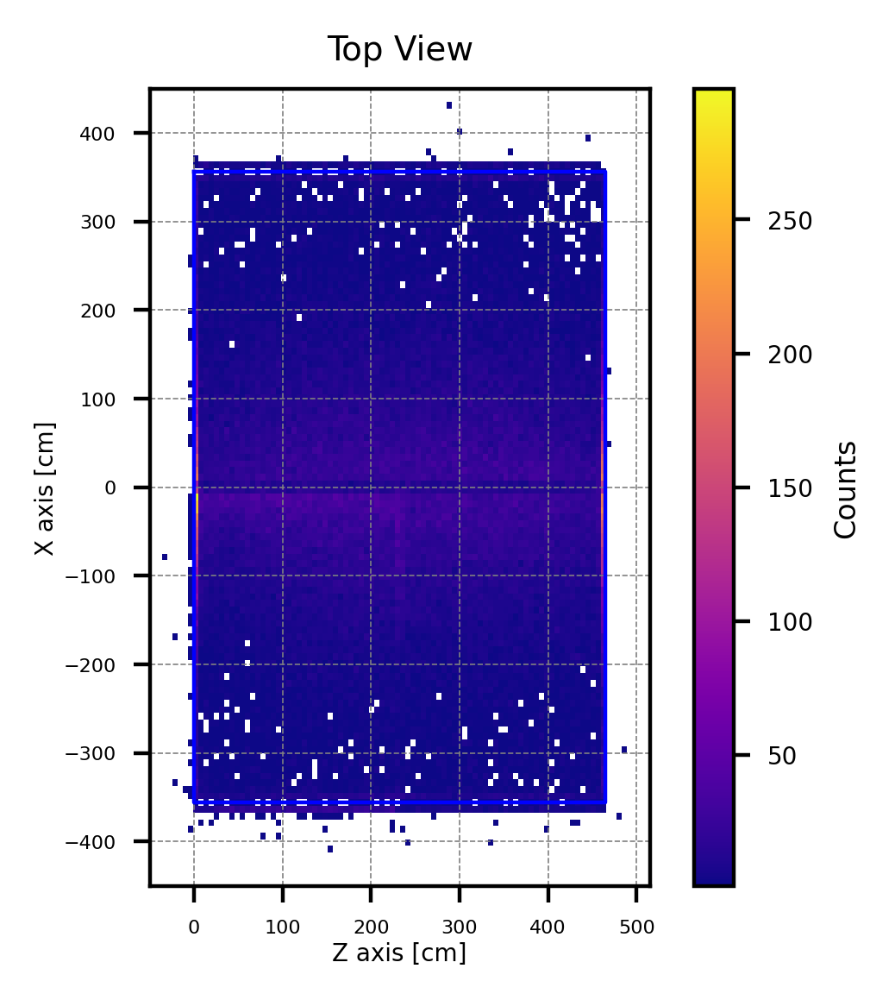

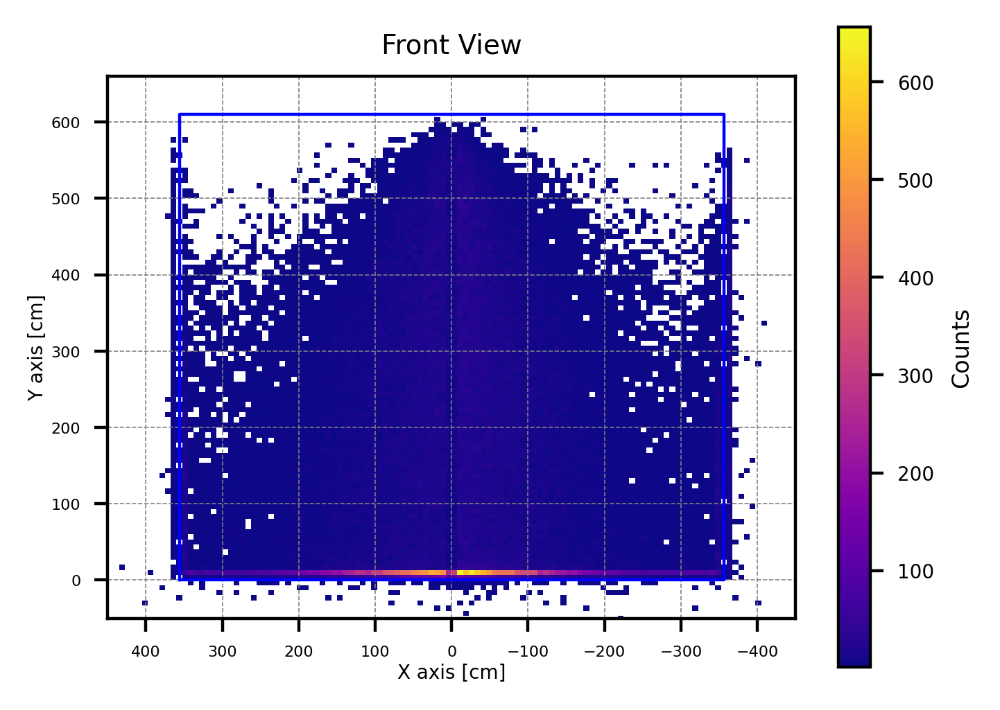

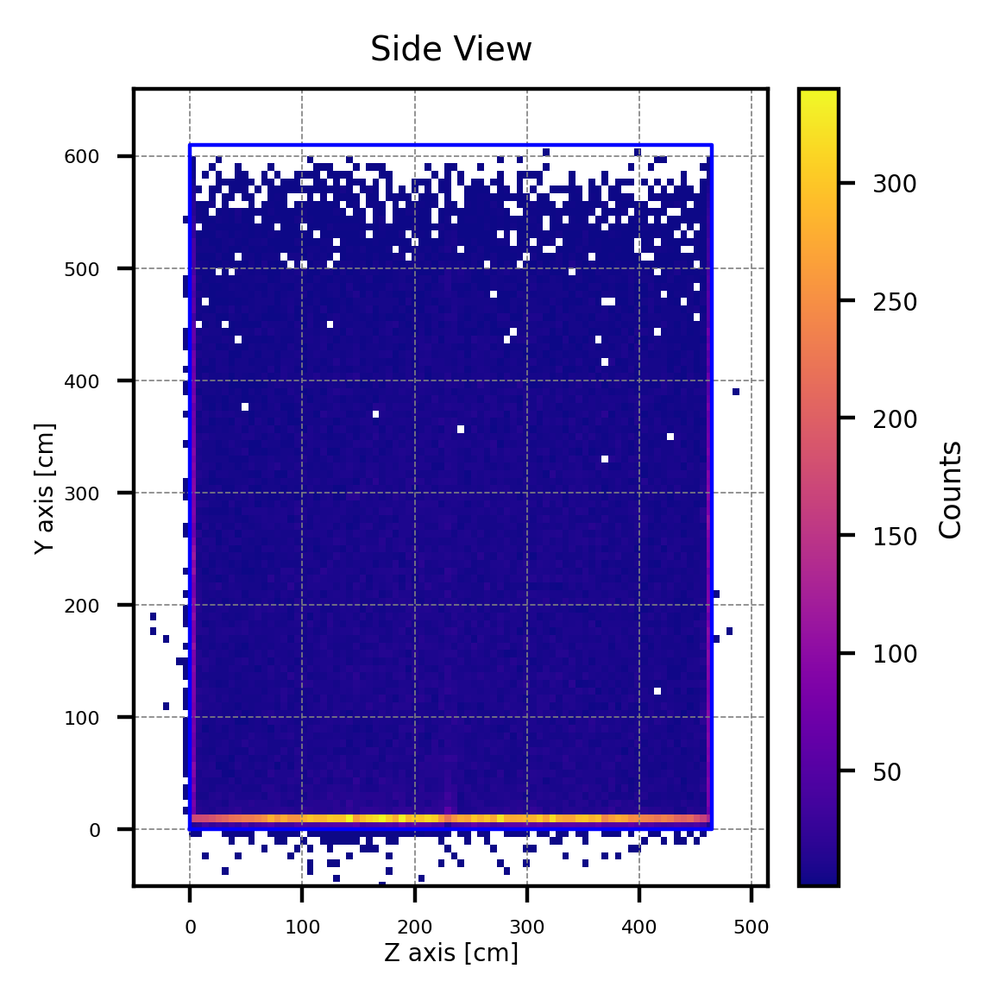

<Figure size 1600x1200 with 0 Axes>

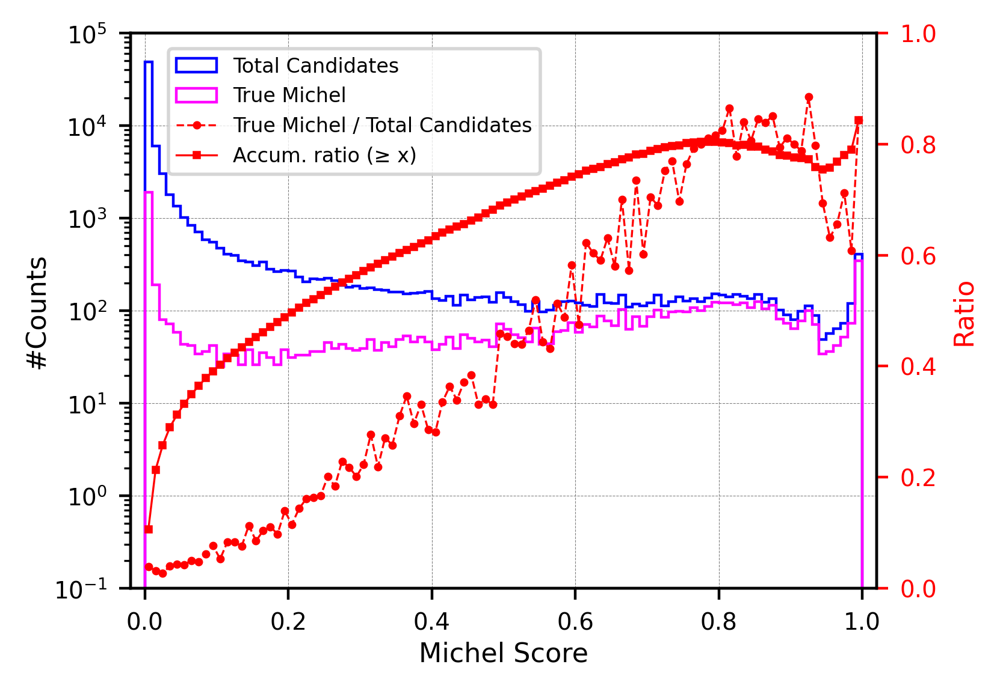

<Figure size 1600x1200 with 0 Axes>

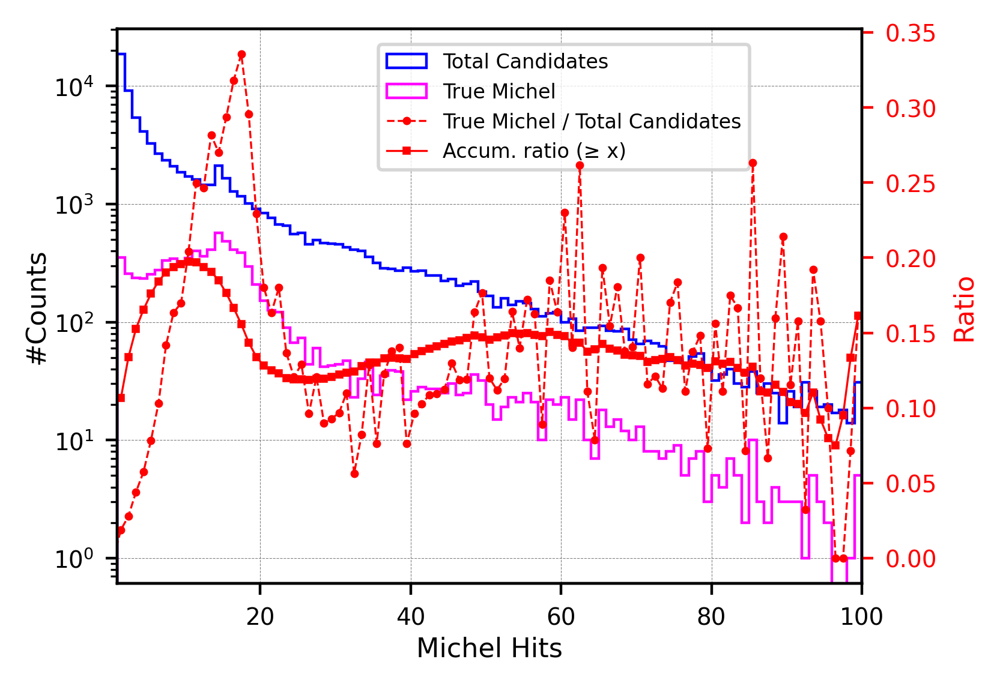

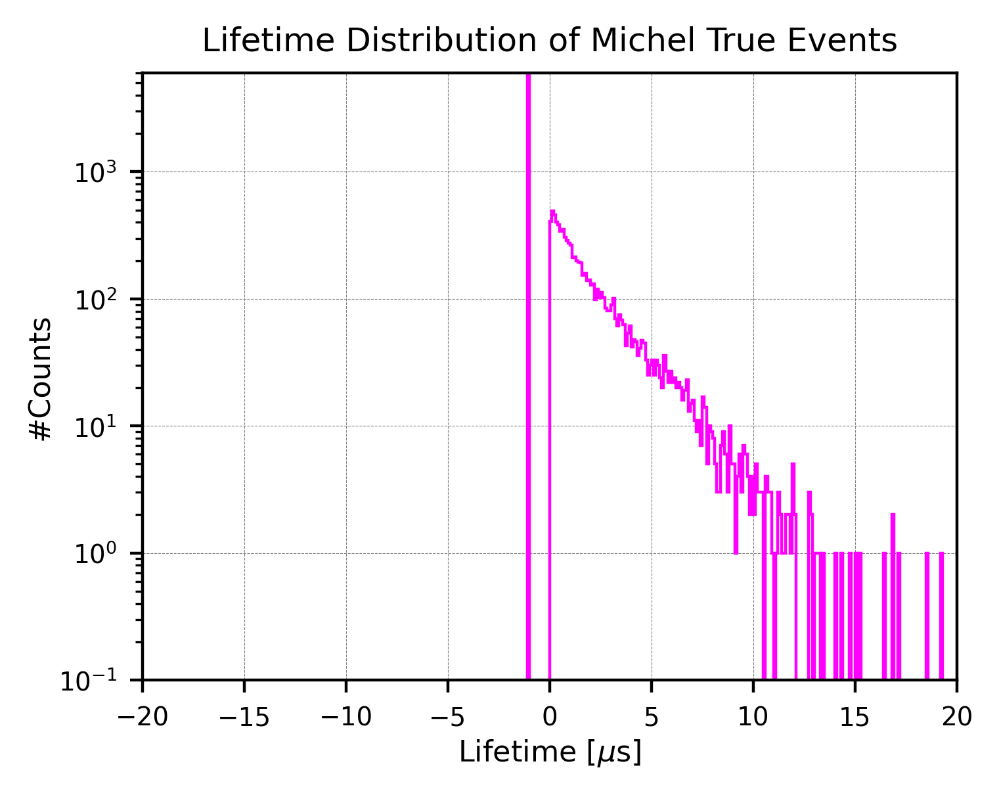

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

#Start drawing figures======================================    
#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465



#Initial values:
vals_decayX_initial = [ev.decayX_initial for ev in events_reco]
vals_decayY_initial = [ev.decayY_initial for ev in events_reco]
vals_decayZ_initial = [ev.decayZ_initial for ev in events_reco]
vals_MS_initial = [ev.MS_initial for ev in events_reco]
vals_MH_initial = [ev.MH_initial for ev in events_reco]
vals_lifetime_initial = [ev.lifetime_initial for ev in events_reco]

vals_decayX_true = [ev.decayX_initial for ev in events_true]
vals_MS_true = [ev.MS_initial for ev in events_true]
vals_MH_true = [ev.MH_initial for ev in events_true]




#Decay points distribution:==========================================
print("\nDecay points distribution: ")

decayX_initial = np.array(decayX_initial)
neg_X = np.sum(decayX_initial < 0)
pos_X = np.sum(decayX_initial >= 0)

num_negX = len([ev for ev in events_reco if ev.decayX_initial < 0])
num_posX = len([ev for ev in events_reco if ev.decayX_initial > 0])

print("# of X < 0 : ", num_negX, "({:.2f}%)".format(num_negX/len(events_reco)*100))
print("# of X >= 0: ", num_posX, "({:.2f}%)".format(num_posX/len(events_reco)*100))



# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)


plt.hist(vals_decayX_initial, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label="Reconstructed events")
plt.hist(vals_decayX_true, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='bar', linewidth=0.8, label="True Michel events")


plt.xlim(-450, 450)
plt.xlabel(r'$x_1$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.1, 3000)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  






#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(vals_decayZ_initial, vals_decayX_initial, bins=(120, 120), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()







#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(vals_decayX_initial, vals_decayY_initial, bins=(120, 120), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Y-Z plane ploting (Side View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY] #y shoud be y---
aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(vals_decayZ_initial, vals_decayY_initial, bins=(120, 120), range=[[zmin, zmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.2)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-50, 515)#z---
plt.ylim(-50, 660)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Side View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 








#Michel score distribution (Original)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 0.01
range_min = 0
range_max = 1.00
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(vals_MS_initial, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(vals_MS_true, bins=bins, range=(range_min, range_max))

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', histtype='step', linewidth=0.8, label="True Michel")

ax1.set_xlim(-0.02, 1.02)
ax1.set_ylim(0.1, 100000)
plt.yscale('log')
ax1.set_xlabel('Michel Score', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero
ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', linewidth=0.6, label="True Michel / Total Candidates")


# --- Accumulated (>= x) ratio ---
# Cumulative sums from the right (>= x)
cum_total = np.cumsum(hist_total[::-1])[::-1]
cum_true  = np.cumsum(hist_true[::-1])[::-1]
acc_ratio = np.divide(cum_true, cum_total,
                      out=np.zeros_like(cum_true, dtype=float),
                      where=cum_total != 0)

# Add the accumulated ratio curve on the secondary y-axis
ax2.plot(bin_centers, acc_ratio, color='red', marker='s', markersize=1.5,
         linestyle='-', linewidth=0.6, label='Accum. ratio (≥ x)')


ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.set_ylim(0, 1.00)
ax2.tick_params(axis='y', labelsize=7, colors='red')

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.3, 0.99),
           fontsize=9, ncol=1, prop={'size': 6})


plt.show()








#Michel hits distribution (Original)-----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(vals_MH_initial, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(vals_MH_true, bins=bins, range=(range_min, range_max))

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', histtype='step', linewidth=0.8, label="True Michel")

ax1.set_xlim(1, 100)
ax1.set_xlabel('Michel Hits', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
plt.yscale('log')
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero
ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', linewidth=0.6, label="True Michel / Total Candidates")



# --- Accumulated (>= x) ratio ---
# Cumulative sums from the right (>= x)
cum_total = np.cumsum(hist_total[::-1])[::-1]
cum_true  = np.cumsum(hist_true[::-1])[::-1]
acc_ratio = np.divide(cum_true, cum_total,
                      out=np.zeros_like(cum_true, dtype=float),
                      where=cum_total != 0)

# Add the accumulated ratio curve on the secondary y-axis
ax2.plot(bin_centers, acc_ratio, color='red', marker='s', markersize=1.5,
         linestyle='-', linewidth=0.6, label='Accum. ratio (≥ x)')



ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.tick_params(axis='y', labelsize=7, colors='red')


# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.6, 0.99),
           fontsize=9, ncol=1, prop={'size': 6})

plt.show() 








#True Lifetime distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_lifetime_initial, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-20, 20)
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 6000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.show()









<br />
<br />
<br />

## Explore True Michel distribution:

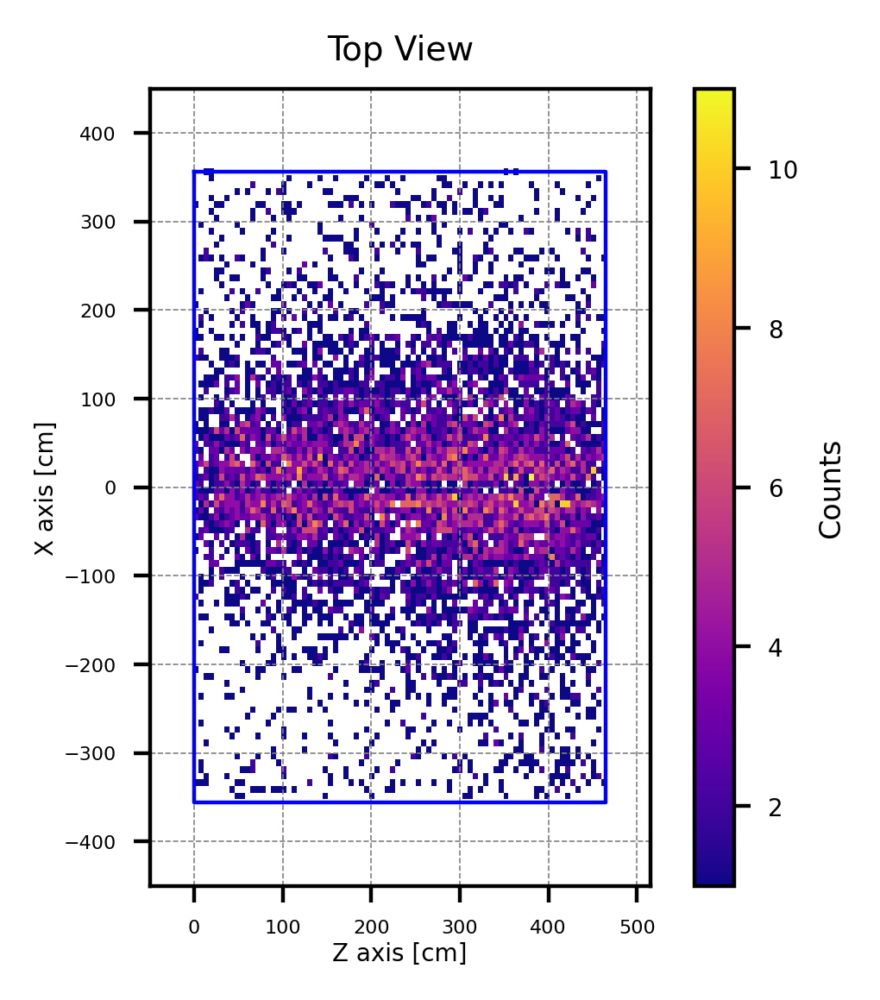

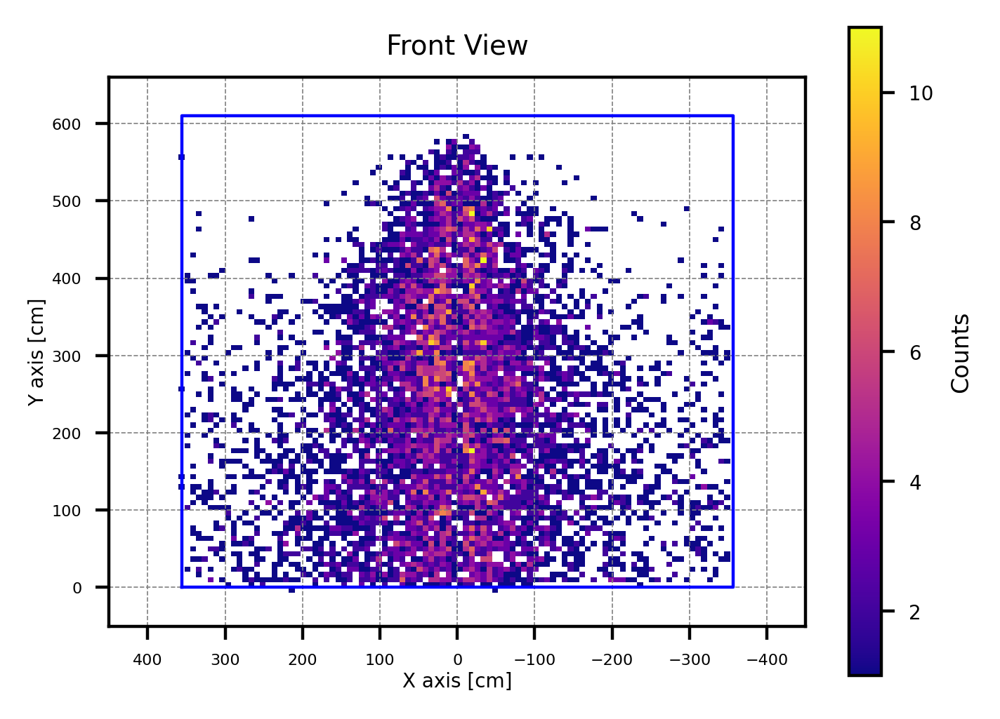

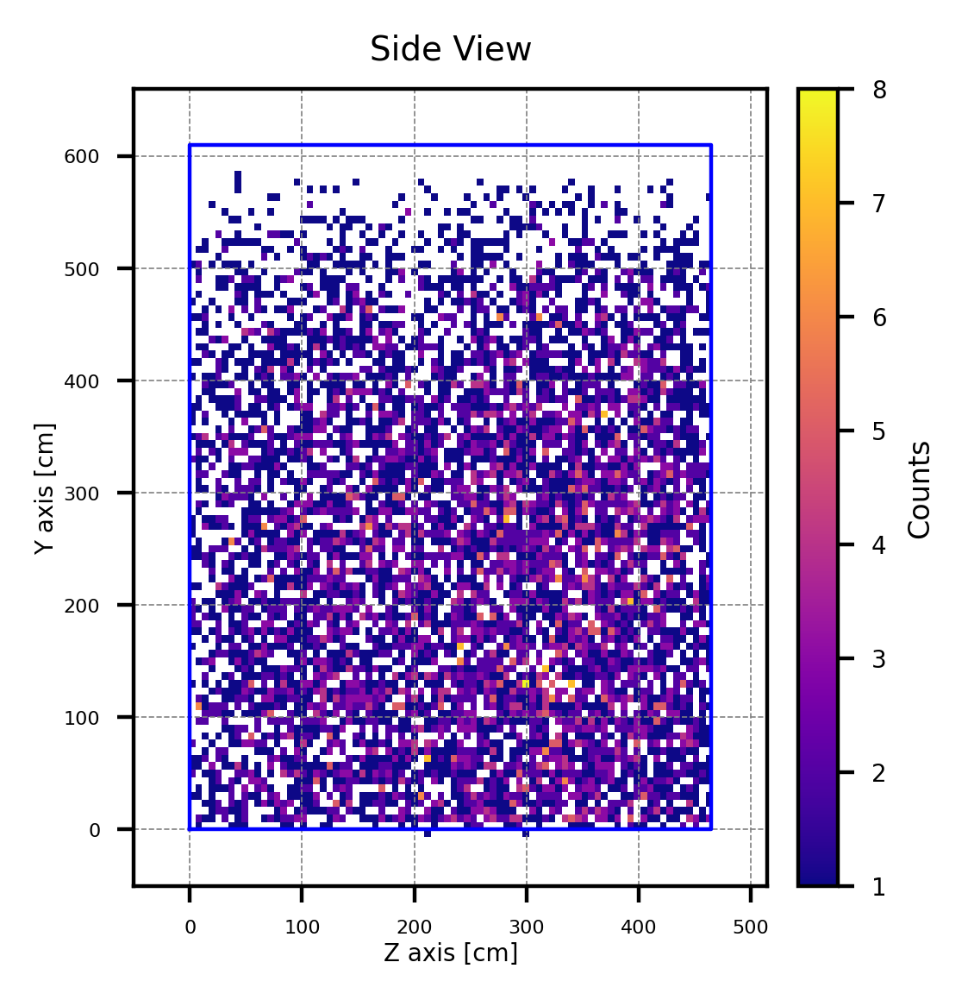

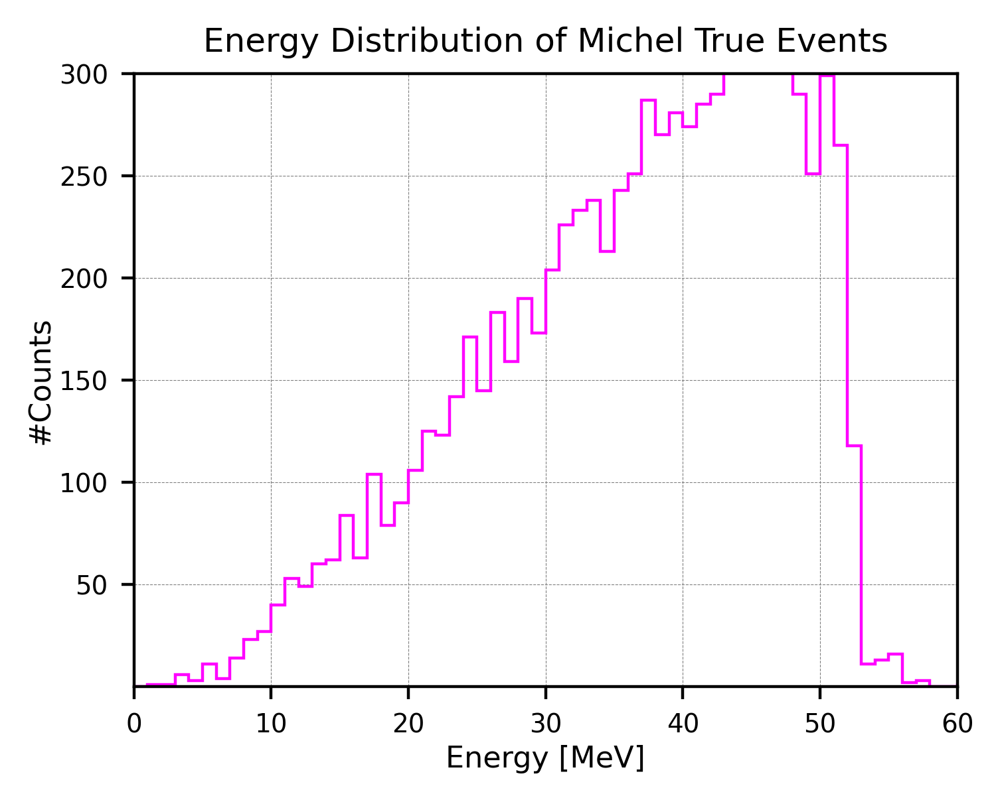

In [4]:
 
vals_decayY_true = [ev.decayY_initial for ev in events_true]
vals_decayZ_true = [ev.decayZ_initial for ev in events_true]
vals_energy_true = [ev.energy_initial for ev in events_true]


#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(vals_decayZ_true, vals_decayX_true, bins=(120, 120), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()





#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(vals_decayX_true, vals_decayY_true, bins=(120, 120), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Y-Z plane ploting (Side View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY] #y shoud be y---
aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(vals_decayZ_true, vals_decayY_true, bins=(120, 120), range=[[zmin, zmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.2)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-50, 515)#z---
plt.ylim(-50, 660)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Side View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 







#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 1.0
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_energy_true, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(0, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 300)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  




### True lifetime fitting:


Michel e^+:  6980 / 79145 (8.82%)
Michel e^-:  1456 / 79145 (1.84%)
False     :  0 / 79145 (0.00%)

#e^+ / #e^-:  6980 / 1456 (4.79)


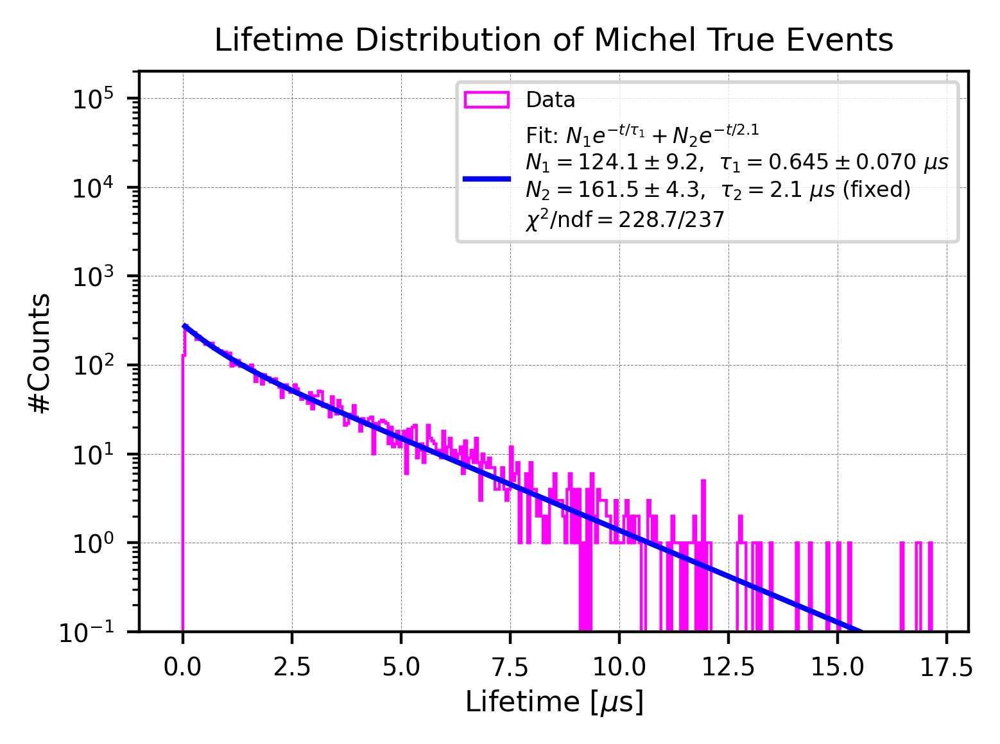

N1 = 124.051 ± 9.234
tau1 = 0.64522 ± 0.07012 us
N2 = 161.487 ± 4.286
chi2/ndf = 228.69/237 = 0.965


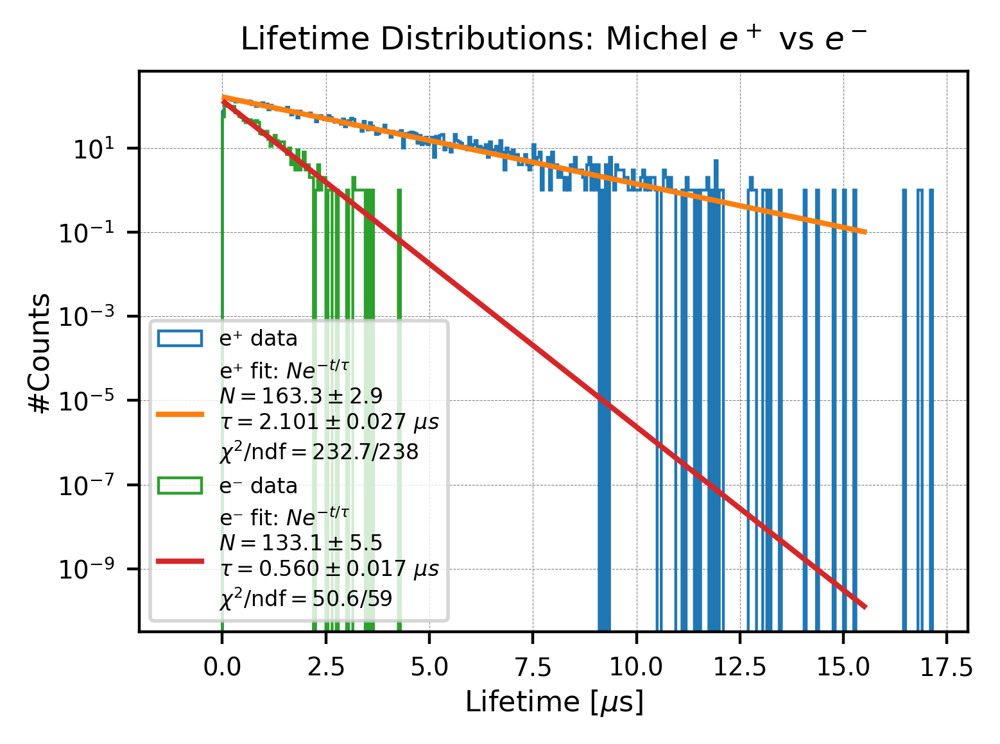

In [5]:

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit




# Seperate Michel e^- and e^+------------------------------
life_pM = []
life_nM = []
count_0= 0

for i in range(0, len(events_true)):
    pdg = events_true[i].pdg_initial
    life = events_true[i].lifetime_initial

    if pdg < 0:
        life_pM.append(life)
    elif pdg > 0:
        life_nM.append(life)
    elif pdg == 0:
        count_0 += 1


print("\nMichel e^+: ", len(life_pM), "/", len(pdg_initial), "({:.2f}%)".format(len(life_pM)/len(pdg_initial)*100))
print("Michel e^-: ", len(life_nM), "/", len(pdg_initial), "({:.2f}%)".format(len(life_nM)/len(pdg_initial)*100))
print("False     : ", count_0, "/", len(pdg_initial), "({:.2f}%)".format(count_0/len(pdg_initial)*100))

print("\n#e^+ / #e^-: ", len(life_pM), "/", len(life_nM), 
      "({:.2f})".format(len(life_pM)/len(life_nM)))




# Define the new exponential decay function=======================================================
# -------------------------
# Model: N1*exp(-t/tau1) + N2*exp(-t/2.2)  (tau2 fixed)
# -------------------------
def exp_decay(t, N1, tau1, N2):
    return N1 * np.exp(-t / tau1) + N2 * np.exp(-t / 2.1)

# Settings for the histogram
plt.figure(figsize=(4, 3), dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Histogram the data
counts, bin_edges = np.histogram(lifetime_initial, bins=bins, range=(range_min, range_max))
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Select data within the fitting range
fit_mask = (bin_centers >= 0.05) & (bin_centers <= 15.5)
x_fit_all = bin_centers[fit_mask]
y_fit_all = counts[fit_mask]

# --- Skip zero bins (avoid infinite weight from 1/sigma^2 with sigma=sqrt(y)) ---
nz = y_fit_all > 0
x_fit = x_fit_all[nz]
y_fit = y_fit_all[nz]
sigma = np.sqrt(y_fit)  # Poisson uncertainty per bin

# Initial guesses (safe)
N1_0 = float(np.max(y_fit)) if y_fit.size else 1.0
tau1_0 = 2.0
N2_0 = max(N1_0 / 10.0, 1.0)

# Weighted least squares fit (absolute_sigma=True → covariance reflects our sigmas)
popt, pcov = curve_fit(
    exp_decay, x_fit, y_fit,
    p0=[N1_0, tau1_0, N2_0],
    sigma=sigma,
    absolute_sigma=True,
    bounds=([0.0, 0.0, 0.0], [np.inf, np.inf, np.inf]),
    maxfev=20000,
)
N1_fit, tau1_fit, N2_fit = popt
perr = np.sqrt(np.diag(pcov))  # 1σ uncertainties
N1_err, tau1_err, N2_err = perr

# Compute chi-squared with provided sigmas
y_exp = exp_decay(x_fit, *popt)
residual = (y_fit - y_exp) / sigma
chi2 = np.sum(residual**2)
ndf = max(len(x_fit) - len(popt), 1)
chi2_ndf = chi2 / ndf

# Smooth curve for plotting
x_smooth = np.linspace(0.05, 15.5, 500)
y_smooth = exp_decay(x_smooth, *popt)

# Plot histogram (data)
plt.hist(lifetime_initial, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=0.8, label="Data")

# Plot the weighted-χ² fit
plt.plot(
    x_smooth, y_smooth, 'b-',
    label=(
        r'Fit: $N_1 e^{-t/\tau_1} + N_2 e^{-t/2.1}$' + '\n'
        + rf'$N_1={N1_fit:.1f}\pm{N1_err:.1f}$,  $\tau_1={tau1_fit:.3f}\pm{tau1_err:.3f}\ \mu s$' + '\n'
        + rf'$N_2={N2_fit:.1f}\pm{N2_err:.1f}$,  $\tau_2=2.1\ \mu s$ (fixed)' + '\n'
        + rf'$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$'
    )
)

# Final plot settings (your style)
plt.xlim(-1, 18)
plt.ylim(0.1, 200000)
plt.yscale('log')
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.legend(fontsize=6)
plt.tight_layout()
plt.show()

# Optional: also print to console
print(
    f"N1 = {N1_fit:.3f} ± {N1_err:.3f}\n"
    f"tau1 = {tau1_fit:.5f} ± {tau1_err:.5f} us\n"
    f"N2 = {N2_fit:.3f} ± {N2_err:.3f}\n"
    f"chi2/ndf = {chi2:.2f}/{ndf} = {chi2_ndf:.3f}"
)









#Fitting seperating for Michel e^+ and e^-=============================================================

# --- single exponential ---
def exp1(t, N, tau):
    return N * np.exp(-t / tau)

# --- plotting / binning setup ---
plt.figure(figsize=(4, 3), dpi=400)
bin_width = 0.05
range_min, range_max = -20, 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- helper: weighted fit (σ = sqrt(y)), skip zeros, draw ---
def fit_and_draw(sample, label_prefix, fit_range=(0.05, 15.5)):#fitting range!---
    # histogram
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    # choose fit window & drop zero bins
    m = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])
    x_all = bin_centers[m]
    y_all = counts[m]
    nz = y_all > 0
    x_fit = x_all[nz]
    y_fit = y_all[nz]

    # abort gracefully if too few points
    if len(y_fit) < 3:
        plt.hist(sample, bins=bins, range=(range_min, range_max),
                 histtype='step', linewidth=0.8, label=f"{label_prefix} MC data")
        return (np.nan, np.nan, np.nan, np.nan, np.nan)

    sigma = np.sqrt(y_fit)

    # safe initial guesses & bounds
    N0, tau0 = float(np.max(y_fit)), 2.0
    bounds = ([0.0, 1e-6], [np.inf, np.inf])

    # weighted least squares
    popt, pcov = curve_fit(
        exp1, x_fit, y_fit, p0=[N0, tau0],
        sigma=sigma, absolute_sigma=True,
        bounds=bounds, maxfev=20000
    )
    N_fit, tau_fit = popt
    N_err, tau_err = np.sqrt(np.diag(pcov))

    # chi2/ndf
    y_mod = exp1(x_fit, *popt)
    r = (y_fit - y_mod) / sigma
    chi2 = float(np.sum(r**2))
    ndf = max(len(x_fit) - len(popt), 1)
    chi2_ndf = chi2 / ndf

    # smooth curve
    x_smooth = np.linspace(fit_range[0], fit_range[1], 500)
    y_smooth = exp1(x_smooth, *popt)

    # draw histogram (step)
    plt.hist(sample, bins=bins, range=(range_min, range_max),
             histtype='step', linewidth=0.8, label=f"{label_prefix} data")

    # draw fit
    plt.plot(
        x_smooth, y_smooth,
        label=(fr"{label_prefix} fit: $Ne^{{-t/\tau}}$" + "\n"
               + rf"$N={N_fit:.1f}\pm{N_err:.1f}$" + "\n"
               + rf"$\tau={tau_fit:.3f}\pm{tau_err:.3f}\ \mu s$" + "\n"
               + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$")
    )


    return (N_fit, tau_fit, N_err, tau_err, chi2_ndf)

# ---- run for both lists ----
N_p, tau_p, dN_p, dtau_p, chi2ndf_p = fit_and_draw(np.asarray(life_pM), "e⁺")
N_n, tau_n, dN_n, dtau_n, chi2ndf_n = fit_and_draw(np.asarray(life_nM), "e⁻")

# --- final plot cosmetics (kept similar to your style) ---
plt.xlim(-2, 18)
#plt.ylim(0.1, 1000)
plt.yscale('log')
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distributions: Michel $e^+$ vs $e^-$', fontsize=9)
plt.legend(fontsize=6)
plt.tight_layout()
plt.show()




<br />
<br />
<br />
<br />
<br />
<br />
<br />
<br />

## TPC cuts:


### Apply cuts gradually:

In [6]:
Space_events_reco = []
MS_events_reco = []
MH_events_reco = [] # After Space & MS & MH cuts---

Space_events_true = []
MS_events_true = []
MH_events_true  = [] # After Space & MS & MH cuts---




#Selection------
for ev in events_reco:
    X = ev.decayX_initial
    Y = ev.decayY_initial
    Z = ev.decayZ_initial
    E = ev.energy_initial
    MS = ev.MS_initial
    MH = ev.MH_initial

        
    #Default region: 0<y<610, 0<z<465 (SPACE CUT)---
    if -356 < X < 356 and 30 < Y < 580 and 30 < Z < 435:    
        Space_events_reco.append(ev)
        if E > 0:
            Space_events_true.append(ev)

        if 0.4 < MS: #(Michel score cut)---
            MS_events_reco.append(ev)
            if E > 0:
                MS_events_true.append(ev)
            
            if 5 <MH: #Michel hits cut---                
                MH_events_reco.append(ev)
                if E > 0:
                    MH_events_true.append(ev) 
                    
                    
                    

                    
#Initial size of dataset:-----
print("Reco events (initial): ", len(events_reco))
print("True events (initial): ", len(events_true), "({:.2f}%)".format(len(events_true)/len(events_reco)*100))

print("\nReco events (Space cut): ", len(Space_events_reco), "({:.2f}%)".format(len(Space_events_reco)/len(events_reco)*100))
print("True events (Space cut): ", len(Space_events_true), "({:.2f}%)".format(len(Space_events_true)/len(Space_events_reco)*100))

print("\nReco events (Space & MS cuts): ", len(MS_events_reco), "({:.2f}%)".format(len(MS_events_reco)/len(events_reco)*100))
print("True events (Space & MS cuts): ", len(MS_events_true), "({:.2f}%)".format(len(MS_events_true)/len(MS_events_reco)*100))


print("\nReco events (Space & MS & MH cuts): ", len(MH_events_reco), "({:.2f}%)".format(len(MH_events_reco)/len(events_reco)*100))
print("True events (Space & MS & MH cuts): ", len(MH_events_true), "({:.2f}%)".format(len(MH_events_true)/len(MH_events_reco)*100))








Reco events (initial):  79145
True events (initial):  8436 (10.66%)

Reco events (Space cut):  34179 (43.19%)
True events (Space cut):  7329 (21.44%)

Reco events (Space & MS cuts):  5061 (6.39%)
True events (Space & MS cuts):  4148 (81.96%)

Reco events (Space & MS & MH cuts):  4302 (5.44%)
True events (Space & MS & MH cuts):  3771 (87.66%)



### Apply all cuts:

In [7]:

TPC_events_reco = [] # After Space & MS & MH cuts---

TPC_events_true  = [] # After Space & MS & MH cuts---




#Selection------
for ev in events_reco:
    X = ev.decayX_initial
    Y = ev.decayY_initial
    Z = ev.decayZ_initial
    E = ev.energy_initial
    MS = ev.MS_initial
    MH = ev.MH_initial

        
    #Default region: 0<y<610, 0<z<465 (SPACE CUT)---
    if -356 < X < 356 and 30 < Y < 580 and 30 < Z < 435:    

        if 0.4 < MS: #(Michel score cut)---
            
            if 5 <MH: #Michel hits cut---                
                TPC_events_reco.append(ev)
                if E > 0:
                    TPC_events_true.append(ev) 



print("\nReco events (Space & MS & MH cuts): ", len(TPC_events_reco), 
      "({:.2f}%)".format(len(TPC_events_reco)/len(events_reco)*100))
print("True events (Space & MS & MH cuts): ", len(TPC_events_true), 
      "({:.2f}%)".format(len(TPC_events_true)/len(TPC_events_reco)*100))





Reco events (Space & MS & MH cuts):  4302 (5.44%)
True events (Space & MS & MH cuts):  3771 (87.66%)


Decay points distribution (After TPC cut): 
# of X < 0 :  1585 (36.843%)
# of X >= 0:  2717 (63.157%)

#decayX_TPC (total):  4302
#decayX_apa1:  56 (1.30%)
#decayX_apa2:  1529 (35.54%)
#decayX_apa3:  1249 (29.03%)
#decayX_apa4:  1468 (34.12%)


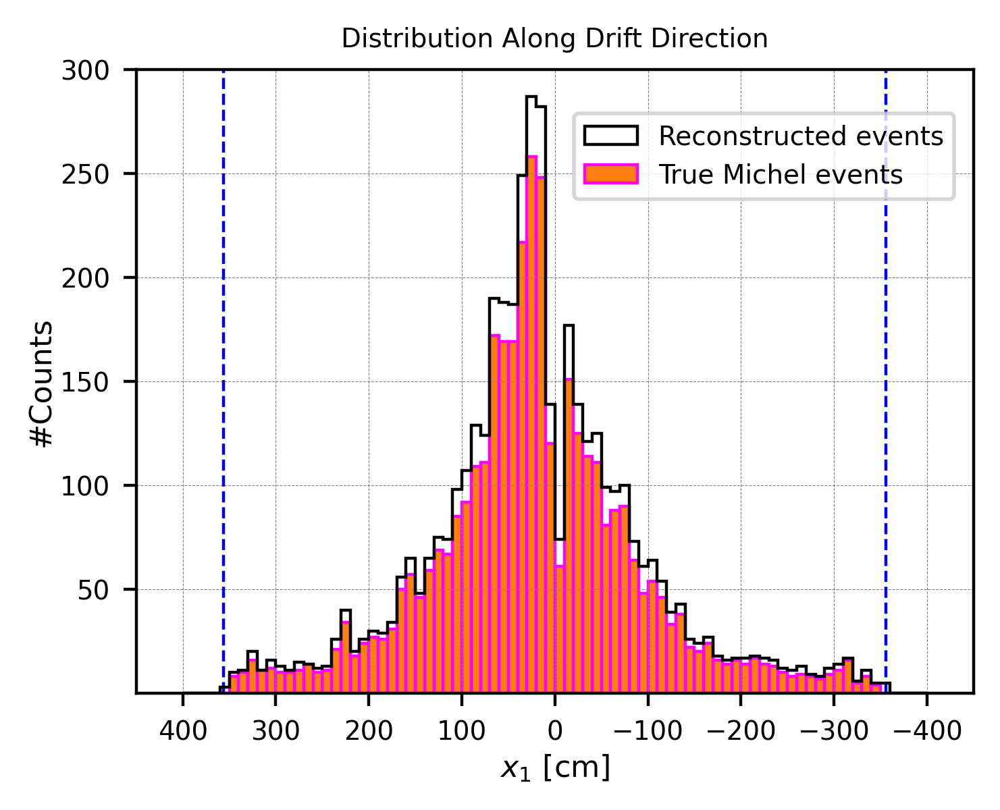

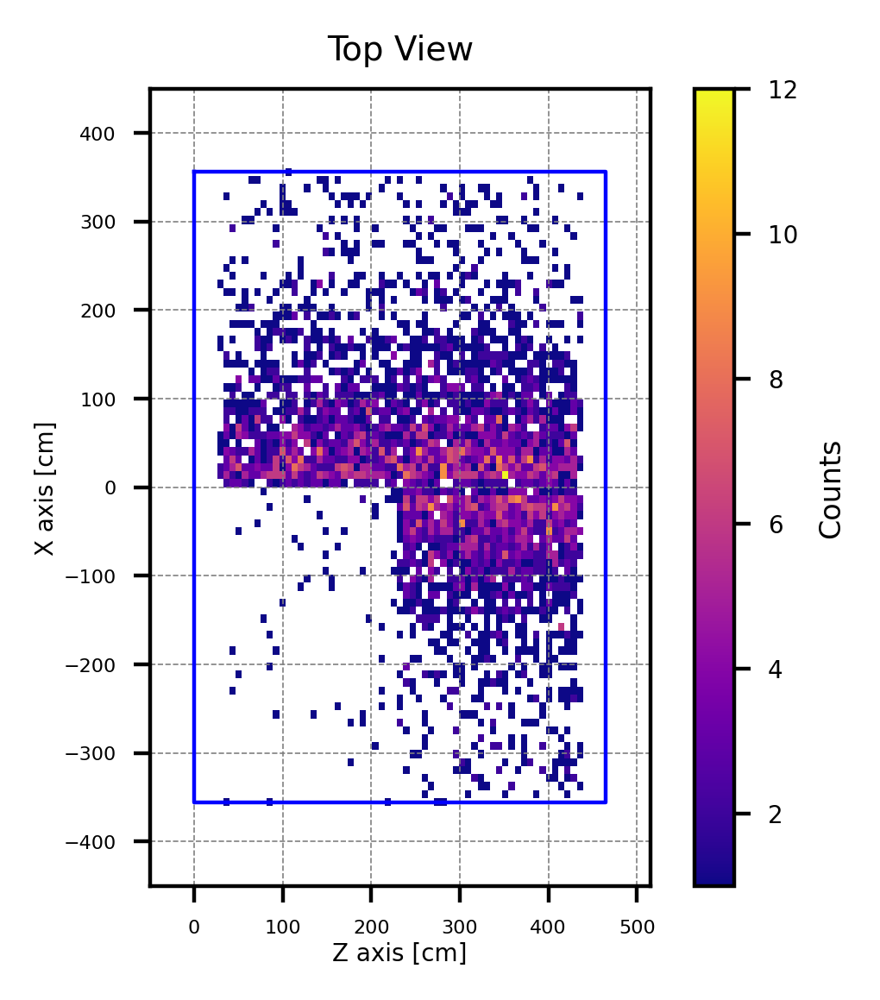

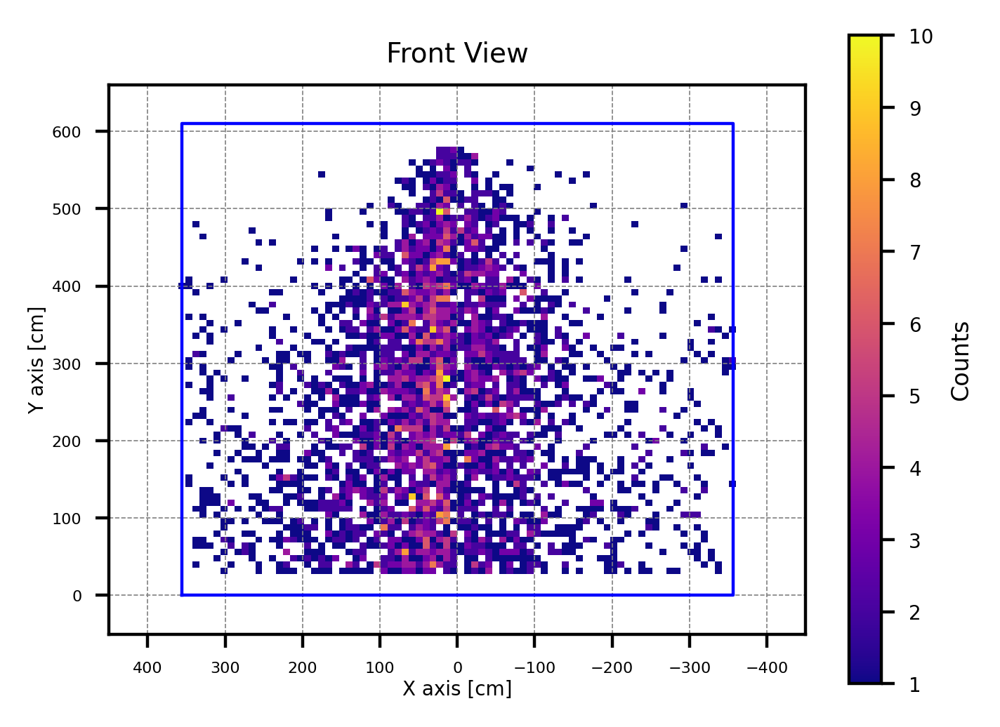

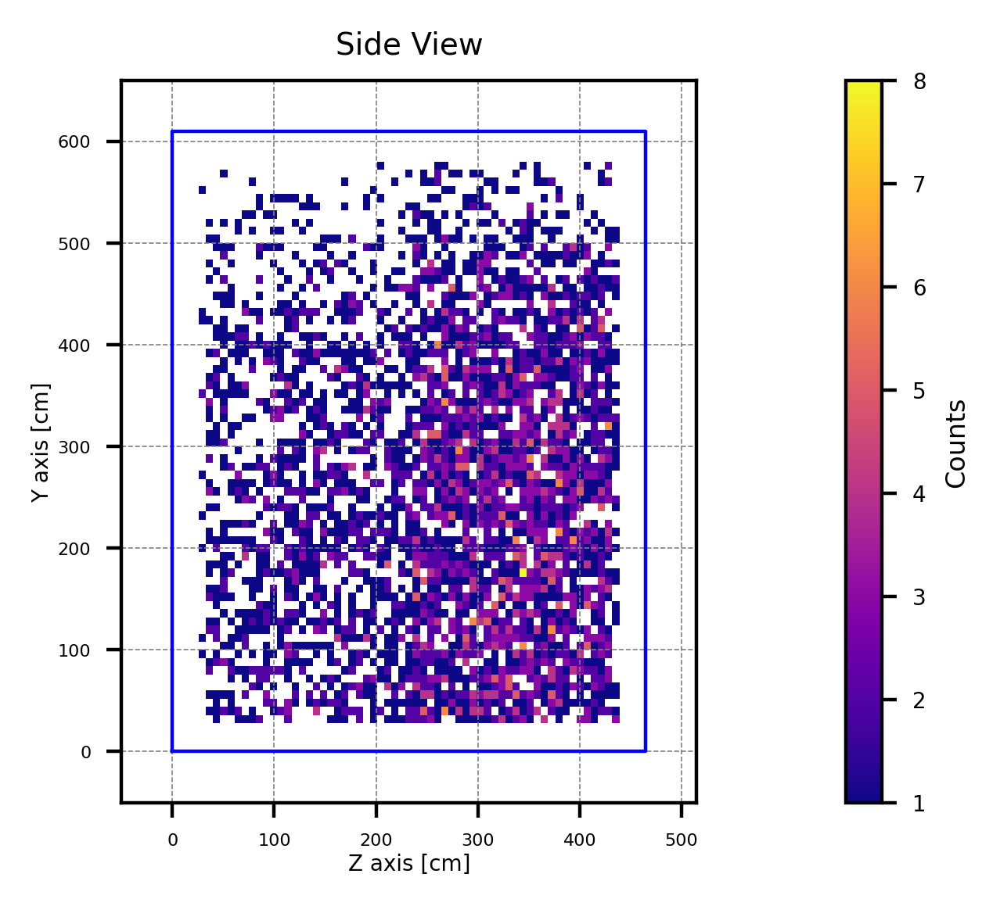

<Figure size 1600x1200 with 0 Axes>

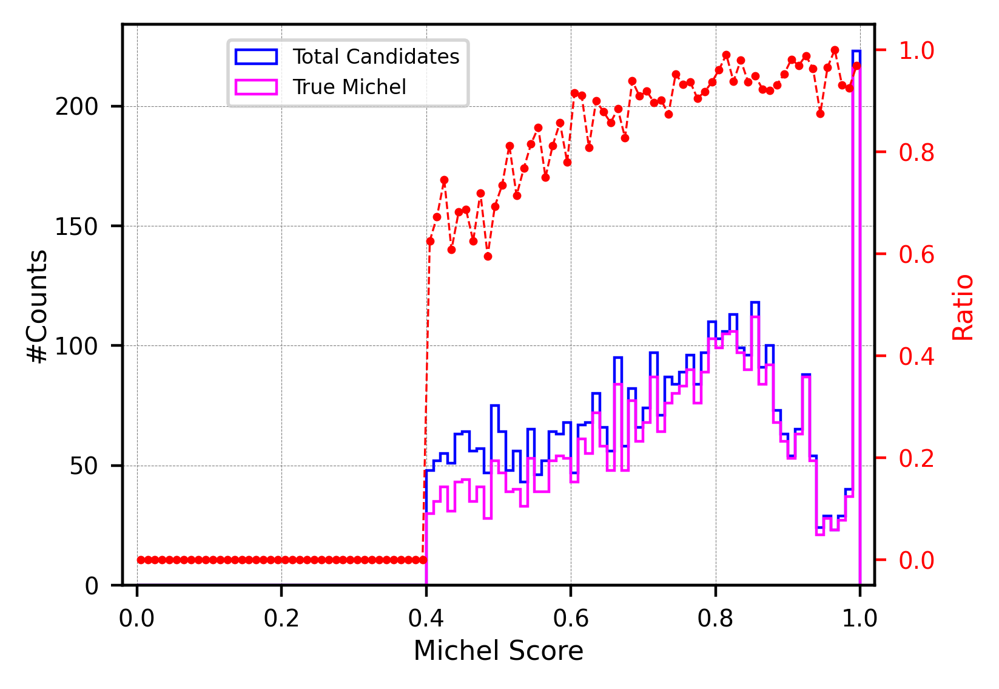

<Figure size 1600x1200 with 0 Axes>

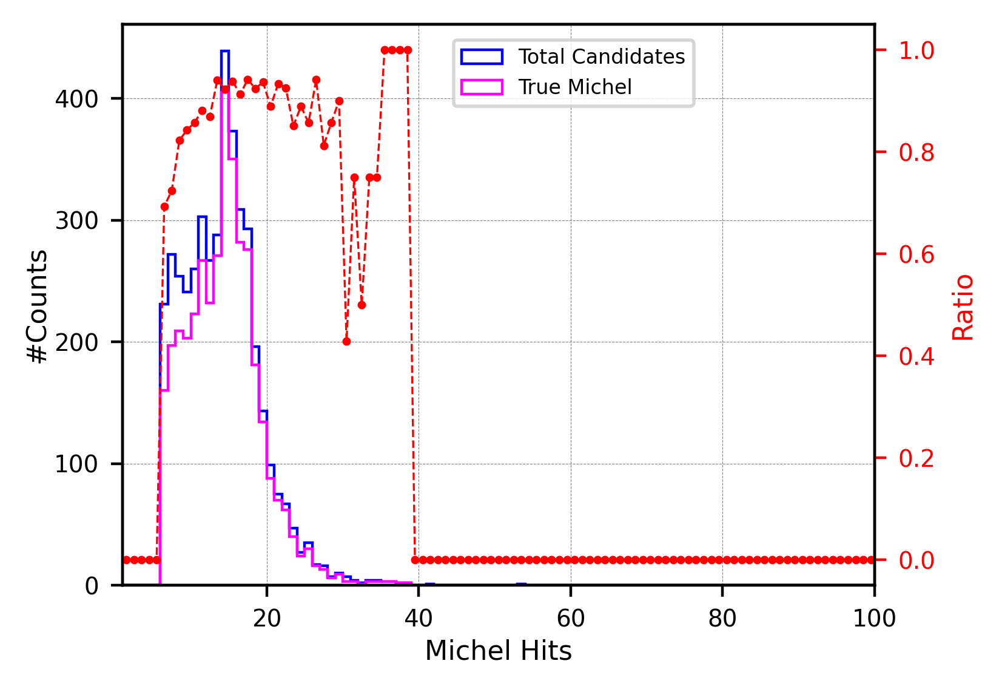




Starting points distribution: 


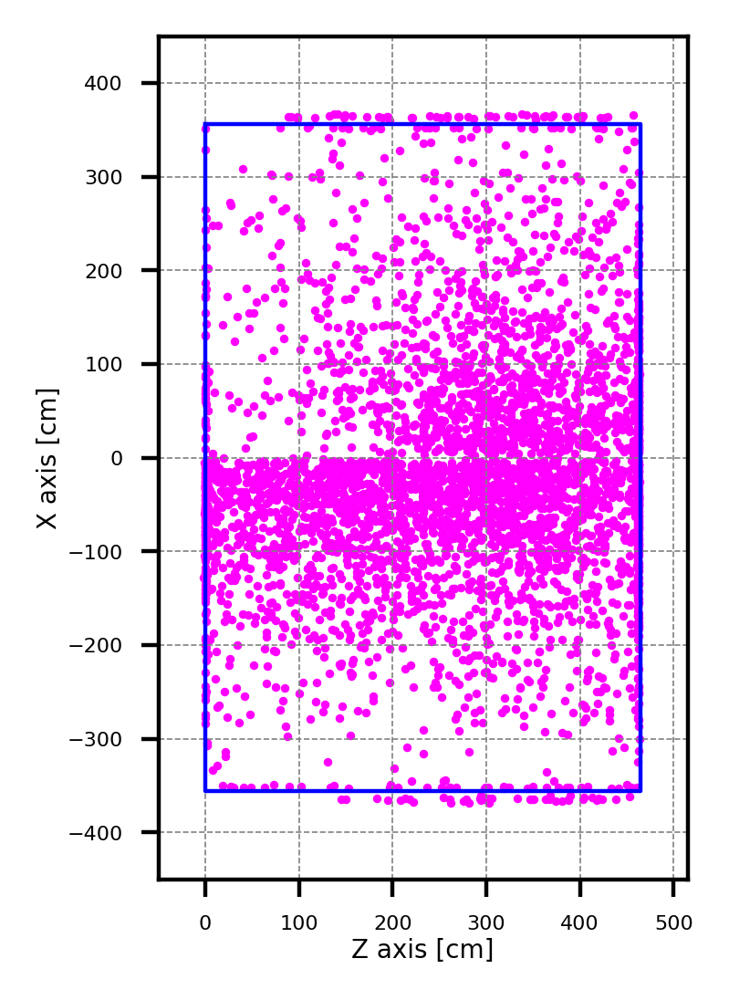

In [24]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

#Start drawing figures======================================    
#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465



TPC_X = [ev.decayX_initial for ev in TPC_events_reco]
TPC_Y = [ev.decayY_initial for ev in TPC_events_reco]
TPC_Z = [ev.decayZ_initial for ev in TPC_events_reco]
TPC_MS = [ev.MS_initial for ev in TPC_events_reco]
TPC_MH = [ev.MH_initial for ev in TPC_events_reco]
TPC_startX = [ev.startX_initial for ev in TPC_events_reco]
TPC_startZ = [ev.startZ_initial for ev in TPC_events_reco]


TPC_X_true = [ev.decayX_initial for ev in TPC_events_true]
TPC_Y_true = [ev.decayY_initial for ev in TPC_events_true]
TPC_Z_true = [ev.decayZ_initial for ev in TPC_events_true]
TPC_MS_true = [ev.MS_initial for ev in TPC_events_true]
TPC_MH_true = [ev.MH_initial for ev in TPC_events_true]




#Decay points distribution:==========================================
print("Decay points distribution (After TPC cut): ")

TPC_X = np.array(TPC_X)
neg_X = np.sum(TPC_X < 0)
pos_X = np.sum(TPC_X >= 0)
print("# of X < 0 : ", neg_X, "({:.3f}%)".format(neg_X/len(TPC_X)*100))
print("# of X >= 0: ", pos_X, "({:.3f}%)".format(pos_X/len(TPC_X)*100))



#Decay points in 4 APA regions:==========================================
decayX_apa1 = []
decayX_apa2 = []
decayX_apa3 = []
decayX_apa4 = []

decayZ_apa1 = []
decayZ_apa2 = []
decayZ_apa3 = []
decayZ_apa4 = []

#Do seperation:
for i in range(0, len(TPC_X)):
    z = TPC_Z[i]
    x = TPC_X[i]

    if x <= 0 and z <= 231.266: #APA1
        decayX_apa1.append(x)
        decayZ_apa1.append(z)              
    elif x <= 0 and z > 231.266: #APA2
        decayX_apa2.append(x)
        decayZ_apa2.append(z)        
    elif x > 0 and z <= 231.266: #APA3
        decayX_apa3.append(x)
        decayZ_apa3.append(z) 
    elif x > 0 and z > 231.266: #APA4
        decayX_apa4.append(x)
        decayZ_apa4.append(z) 


print("\n#decayX_TPC (total): ", len(TPC_X))
print("#decayX_apa1: ", len(decayX_apa1), "({:.2f}%)".format(len(decayX_apa1)/len(TPC_X)*100))
print("#decayX_apa2: ", len(decayX_apa2), "({:.2f}%)".format(len(decayX_apa2)/len(TPC_X)*100))
print("#decayX_apa3: ", len(decayX_apa3), "({:.2f}%)".format(len(decayX_apa3)/len(TPC_X)*100))
print("#decayX_apa4: ", len(decayX_apa4), "({:.2f}%)".format(len(decayX_apa4)/len(TPC_X)*100))








#Decay points distribution:==========================================



# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-356, -356], [0, 300], color="blue", linewidth=0.8, linestyle='--')
plt.plot([356, 356], [0, 300], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(TPC_X, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label="Reconstructed events")
plt.hist(TPC_X_true, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='bar', linewidth=0.8, label="True Michel events")


plt.xlim(-450, 450)
plt.xlabel(r'$x_1$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 






#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(TPC_Z, TPC_X, bins=(100, 100), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()







#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(TPC_X, TPC_Y, bins=(100, 100), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 






#Y-Z plane ploting (Side View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY] #y shoud be y---
aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(TPC_Z, TPC_Y, bins=(100, 100), range=[[zmin, zmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-50, 515)#z---
plt.ylim(-50, 660)
#plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Side View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 









#Michel score distribution ----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 0.01
range_min = 0
range_max = 1.00
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(TPC_MS, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(TPC_MS_true, bins=bins, range=(range_min, range_max))

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', histtype='step', linewidth=0.8, label="True Michel")

ax1.set_xlim(-0.02, 1.02)
ax1.set_xlabel('Michel Score', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero
ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', linewidth=0.6, label="True Michel / Total Candidates")

ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.tick_params(axis='y', labelsize=7, colors='red')

plt.show()









 

#Michel hits distribution -----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(TPC_MH, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(TPC_MH_true, bins=bins, range=(range_min, range_max))

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', histtype='step', linewidth=0.8, label="True Michel")

ax1.set_xlim(1, 100)
ax1.set_xlabel('Michel Hits', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.6, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero
ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', linewidth=0.6, label="True Michel / Total Candidates")

ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.tick_params(axis='y', labelsize=7, colors='red')

plt.show() 








#Starting points distribution:==========================================
print("\n\n\nStarting points distribution: ")

#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux2 = [0, 465, 465, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux2, aux1, color="blue", linewidth=0.8, linestyle='-')

#Drawing of data points------
plt.scatter(TPC_startZ, TPC_startX, c='magenta', s=2.0, alpha=1.0, marker='.', label='Magenta Bias')

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()



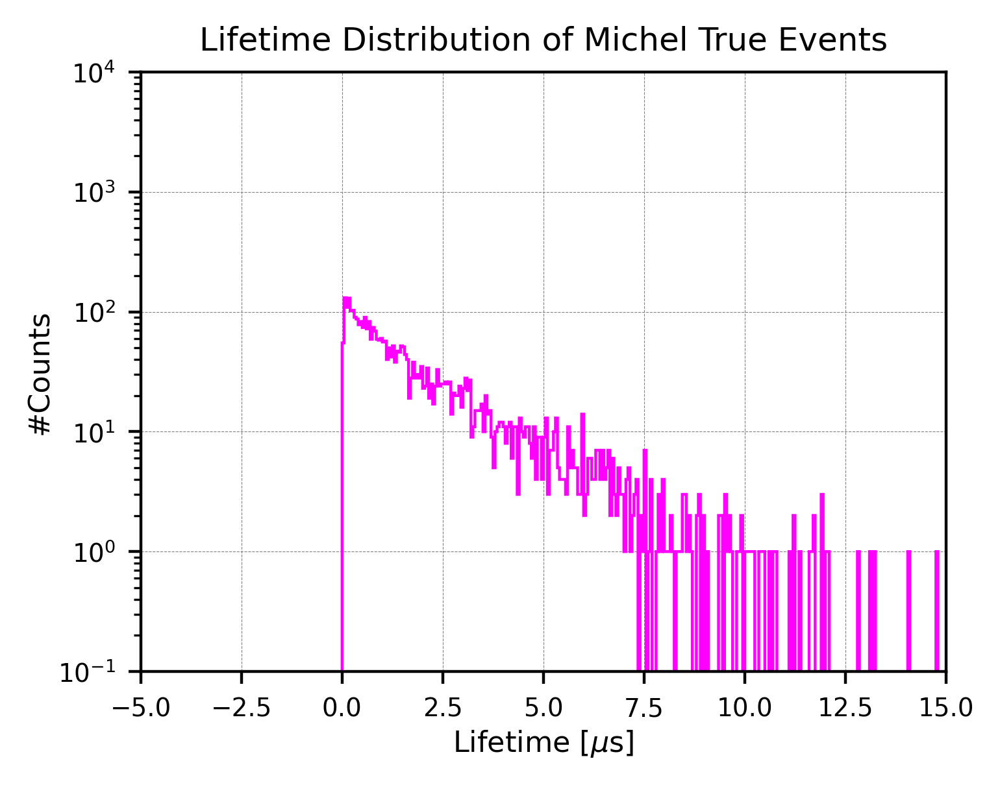

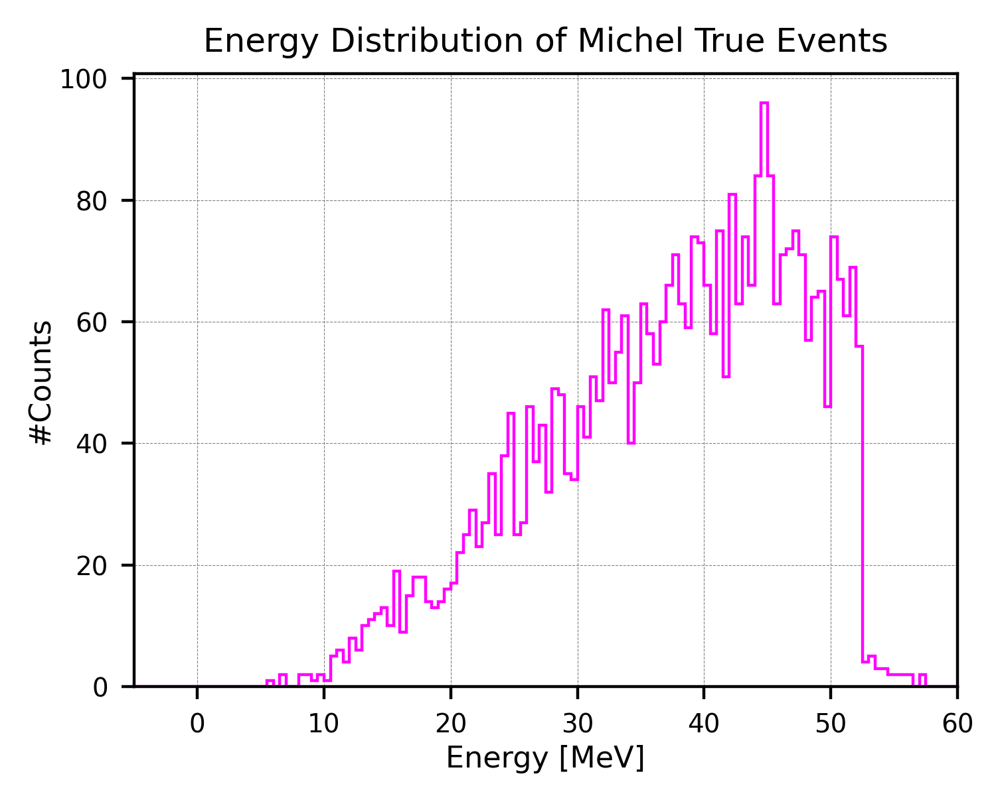

In [ ]:

TPC_lifetime_true = [ev.lifetime_initial for ev in TPC_events_true]
TPC_energy_true = [ev.energy_initial for ev in TPC_events_true]


#True Lifetime distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(TPC_lifetime_true, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 15)
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 10000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.show()  








#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(TPC_energy_true, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 10000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  


### New fittings:

(TPC cut) Michel e^+  :  3099 / 4302 (72.04%)
(TPC cut) Michel e^-  :  672 / 4302 (15.62%)
(TPC cut) False Michel:  672 / 4302 (15.62%)


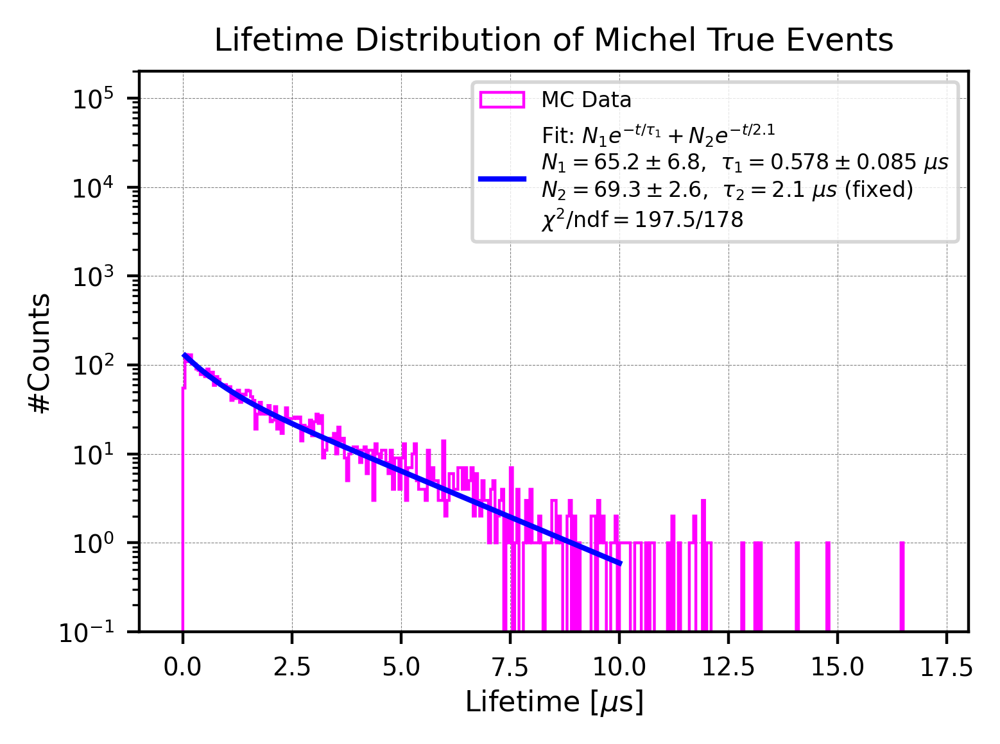

N1 = 65.188 ± 6.760
tau1 = 0.57813 ± 0.08470 us
N2 = 69.300 ± 2.620
chi2/ndf = 197.55/178 = 1.110


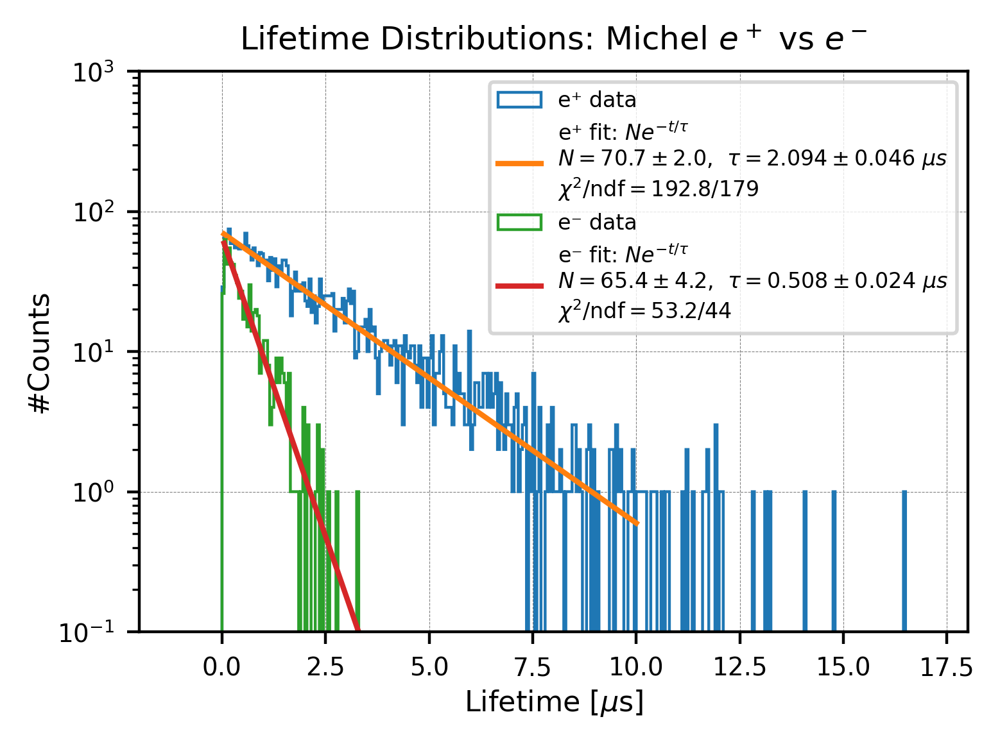

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit



# Seperate Michel e^- and e^+ (true events)------------------------------
TPC_life_pM = []
TPC_life_nM = []
count = 0
for ev in TPC_events_reco:
    pdg = ev.pdg_initial
    life = ev.lifetime_initial

    if pdg < 0:
        TPC_life_pM.append(life)
    elif pdg > 0:
        TPC_life_nM.append(life)
    elif pdg == 0:
        count += 1

print("(TPC cut) Michel e^+  : ", len(TPC_life_pM), "/", len(TPC_events_reco), 
      "({:.2f}%)".format(len(TPC_life_pM)/len(TPC_events_reco)*100))
print("(TPC cut) Michel e^-  : ", len(TPC_life_nM), "/", len(TPC_events_reco), 
      "({:.2f}%)".format(len(TPC_life_nM)/len(TPC_events_reco)*100))
print("(TPC cut) False Michel: ", len(TPC_life_nM), "/", len(TPC_events_reco), 
      "({:.2f}%)".format(len(TPC_life_nM)/len(TPC_events_reco)*100))








# Define the new exponential decay function=======================================================
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ============================================================
# Exponential decay model (bin-by-bin, tau2 fixed)
# ============================================================
def exp_decay(t, N1, tau1, N2):
    return N1 * np.exp(-t / tau1) + N2 * np.exp(-t / 2.1)

# ============================================================
# Histogram setup
# ============================================================
plt.figure(figsize=(4, 3), dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Histogram the data
counts, bin_edges = np.histogram(TPC_lifetime_true, bins=bins, range=(range_min, range_max))
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# ============================================================
# Select fitting region
# ============================================================
fit_mask = (bin_centers >= 0.05) & (bin_centers <= 10)
x_fit_all = bin_centers[fit_mask]
y_fit_all = counts[fit_mask]

# Skip zero bins (avoid div by 0 in weights)
nz = y_fit_all > 0
x_fit = x_fit_all[nz]
y_fit = y_fit_all[nz]
sigma = np.sqrt(y_fit)  # Poisson errors

# ============================================================
# Initial guesses
# ============================================================
N1_0 = float(np.max(y_fit)) if y_fit.size else 1.0
tau1_0 = 2.0
N2_0 = max(N1_0 / 10.0, 1.0)

# ============================================================
# Weighted least squares fit
# ============================================================
popt, pcov = curve_fit(
    exp_decay, x_fit, y_fit,
    p0=[N1_0, tau1_0, N2_0],
    sigma=sigma,
    absolute_sigma=True,
    bounds=([0.0, 0.0, 0.0], [np.inf, np.inf, np.inf]),
    maxfev=20000,
)
N1_fit, tau1_fit, N2_fit = popt
perr = np.sqrt(np.diag(pcov))
N1_err, tau1_err, N2_err = perr

# ============================================================
# Chi² / ndf
# ============================================================
y_exp = exp_decay(x_fit, *popt)
residual = (y_fit - y_exp) / sigma
chi2 = np.sum(residual**2)
ndf = max(len(x_fit) - len(popt), 1)
chi2_ndf = chi2 / ndf

# ============================================================
# Smooth curve for plotting
# ============================================================
x_smooth = np.linspace(0.05, 10, 500)
y_smooth = exp_decay(x_smooth, *popt)

# ============================================================
# Plot histogram
# ============================================================
plt.hist(TPC_lifetime_true, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=0.8, label="MC Data")

# Plot fitted curve
plt.plot(
    x_smooth, y_smooth, 'b-',
    label=(
        r'Fit: $N_1 e^{-t/\tau_1} + N_2 e^{-t/2.1}$' + '\n'
        + rf'$N_1={N1_fit:.1f}\pm{N1_err:.1f}$,  $\tau_1={tau1_fit:.3f}\pm{tau1_err:.3f}\ \mu s$' + '\n'
        + rf'$N_2={N2_fit:.1f}\pm{N2_err:.1f}$,  $\tau_2=2.1\ \mu s$ (fixed)' + '\n'
        + rf'$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$'
    )
)

# ============================================================
# Style
# ============================================================
plt.xlim(-1, 18)
plt.ylim(0.1, 200000)
plt.yscale('log')
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.legend(fontsize=6)
plt.tight_layout()
plt.show()

# ============================================================
# Print results
# ============================================================
print(
    f"N1 = {N1_fit:.3f} ± {N1_err:.3f}\n"
    f"tau1 = {tau1_fit:.5f} ± {tau1_err:.5f} us\n"
    f"N2 = {N2_fit:.3f} ± {N2_err:.3f}\n"
    f"chi2/ndf = {chi2:.2f}/{ndf} = {chi2_ndf:.3f}"
)













#Fitting seperating for Michel e^+ and e^-=============================================================

# --- single exponential ---
def exp1(t, N, tau):
    return N * np.exp(-t / tau)

# --- plotting / binning setup ---
plt.figure(figsize=(4, 3), dpi=400)
bin_width = 0.05
range_min, range_max = -20, 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- helper: weighted fit (σ = sqrt(y)), skip zeros, draw ---
def fit_and_draw(sample, label_prefix, fit_range=(0.05, 10)):
    # histogram
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    # choose fit window & drop zero bins
    m = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])
    x_all = bin_centers[m]
    y_all = counts[m]
    nz = y_all > 0
    x_fit = x_all[nz]
    y_fit = y_all[nz]

    # abort gracefully if too few points
    if len(y_fit) < 3:
        plt.hist(sample, bins=bins, range=(range_min, range_max),
                 histtype='step', linewidth=0.8, label=f"{label_prefix} MC data")
        return (np.nan, np.nan, np.nan, np.nan, np.nan)

    sigma = np.sqrt(y_fit)

    # safe initial guesses & bounds
    N0, tau0 = float(np.max(y_fit)), 2.0
    bounds = ([0.0, 1e-6], [np.inf, np.inf])

    # weighted least squares
    popt, pcov = curve_fit(
        exp1, x_fit, y_fit, p0=[N0, tau0],
        sigma=sigma, absolute_sigma=True,
        bounds=bounds, maxfev=20000
    )
    N_fit, tau_fit = popt
    N_err, tau_err = np.sqrt(np.diag(pcov))

    # chi2/ndf
    y_mod = exp1(x_fit, *popt)
    r = (y_fit - y_mod) / sigma
    chi2 = float(np.sum(r**2))
    ndf = max(len(x_fit) - len(popt), 1)
    chi2_ndf = chi2 / ndf

    # smooth curve
    x_smooth = np.linspace(fit_range[0], fit_range[1], 500)
    y_smooth = exp1(x_smooth, *popt)

    # draw histogram (step)
    plt.hist(sample, bins=bins, range=(range_min, range_max),
             histtype='step', linewidth=0.8, label=f"{label_prefix} data")

    # draw fit
    plt.plot(
        x_smooth, y_smooth,
        label=(fr"{label_prefix} fit: $Ne^{{-t/\tau}}$" + "\n"
               + rf"$N={N_fit:.1f}\pm{N_err:.1f}$,  $\tau={tau_fit:.3f}\pm{tau_err:.3f}\ \mu s$" + "\n"
               + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$")
    )

    return (N_fit, tau_fit, N_err, tau_err, chi2_ndf)

# ---- run for both lists ----
N_p, tau_p, dN_p, dtau_p, chi2ndf_p = fit_and_draw(np.asarray(TPC_life_pM), "e⁺")
N_n, tau_n, dN_n, dtau_n, chi2ndf_n = fit_and_draw(np.asarray(TPC_life_nM), "e⁻")

# --- final plot cosmetics (kept similar to your style) ---
plt.xlim(-2, 18)
plt.ylim(0.1, 1000)
plt.yscale('log')
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distributions: Michel $e^+$ vs $e^-$', fontsize=9)
plt.legend(fontsize=6)
plt.tight_layout()
plt.show()





<br />
<br />
<br />

## Explore Pandora Reco Efficiency:

#### Check if the track passes cathode or anode planes:

In [31]:
import numpy as np
import os

def check_intersection(p0, p1, x_plane, ymin=0.0, ymax=610.0, zmin=0.0, zmax=465.0):
    """
    Check if line segment (p0->p1) crosses vertical plane x=x_plane inside given YZ rectangle.
    Returns True/False.
    """
    x0, y0, z0 = p0
    x1, y1, z1 = p1

    if (x0 <= x_plane <= x1) or (x1 <= x_plane <= x0):
        if x1 != x0:
            t = (x_plane - x0) / (x1 - x0)
            if 0.0 <= t <= 1.0:
                y_int = y0 + t * (y1 - y0)
                z_int = z0 + t * (z1 - z0)
                return (ymin <= y_int <= ymax) and (zmin <= z_int <= zmax)
    return False


def check_tracks(file_start, file_end, date_label):
    """Check muon tracks against cathode and anode planes, return passing list."""
    start_points = np.loadtxt(file_start)
    end_points   = np.loadtxt(file_end)

    passingList = []

    for i, (p0, p1) in enumerate(zip(start_points, end_points)):

        # First priority: cathode plane (x=0)
        if check_intersection(p0, p1, x_plane=0):
            passingList.append(1)
            continue

        # Second: anode planes (x = -356 or +356)
        if check_intersection(p0, p1, x_plane=-356) or check_intersection(p0, p1, x_plane=356):
            passingList.append(2)
            continue

        # Otherwise: no crossing
        passingList.append(0)

    return passingList


# === Run over both datasets ===
base_path = "./statResult"

datasets = [
    (os.path.join(base_path, "20251001_muStart.txt"),
     os.path.join(base_path, "20251001_muEnd.txt"),
     "20251001"),
    
    (os.path.join(base_path, "20251002_muStart.txt"),
     os.path.join(base_path, "20251002_muEnd.txt"),
     "20251002")
]

# Global dict of results: keys = date, values = passingList
passingLists = {}
for start_file, end_file, date_label in datasets:
    passingLists[date_label] = check_tracks(start_file, end_file, date_label)

# === Print summary ===
for date_label, plist in passingLists.items():
    print(f"=== {date_label} ===")
    for i, status in enumerate(plist):
        print(f"Event {i}: {status}")




# concatenate both lists into one, same order as your txt reading
passing_total = passingLists["20251001"] + passingLists["20251002"]




=== 20251001 ===
Event 0: 0
Event 1: 1
Event 2: 0
Event 3: 2
Event 4: 0
Event 5: 0
Event 6: 1
Event 7: 0
Event 8: 0
Event 9: 0
Event 10: 2
Event 11: 2
Event 12: 2
Event 13: 1
Event 14: 0
Event 15: 2
Event 16: 0
Event 17: 0
Event 18: 0
Event 19: 2
Event 20: 0
Event 21: 1
Event 22: 0
Event 23: 0
Event 24: 0
Event 25: 2
Event 26: 0
Event 27: 0
Event 28: 0
Event 29: 0
Event 30: 0
Event 31: 1
Event 32: 0
Event 33: 0
Event 34: 0
Event 35: 2
Event 36: 0
Event 37: 2
Event 38: 0
Event 39: 0
Event 40: 0
Event 41: 0
Event 42: 0
Event 43: 0
Event 44: 0
Event 45: 2
Event 46: 0
Event 47: 0
Event 48: 1
Event 49: 0
Event 50: 0
Event 51: 0
Event 52: 0
Event 53: 0
Event 54: 1
Event 55: 0
Event 56: 0
Event 57: 2
Event 58: 0
Event 59: 0
Event 60: 0
Event 61: 0
Event 62: 0
Event 63: 2
Event 64: 0
Event 65: 0
Event 66: 0
Event 67: 0
Event 68: 0
Event 69: 2
Event 70: 1
Event 71: 0
Event 72: 0
Event 73: 2
Event 74: 0
Event 75: 0
Event 76: 0
Event 77: 0
Event 78: 0
Event 79: 0
Event 80: 0
Event 81: 1
Event 82:

In [33]:
from dataclasses import dataclass
from typing import List

# --- Updated multiple-file reading (all in ./statResult) ---

decayX_veryIni = read_multiple([
    './statResult/20251001_x.txt',
    './statResult/20251002_x.txt'
])

decayY_veryIni = read_multiple([
    './statResult/20251001_y.txt',
    './statResult/20251002_y.txt'
])

decayZ_veryIni = read_multiple([
    './statResult/20251001_z.txt',
    './statResult/20251002_z.txt'
])

energy_veryIni = read_multiple([
    './statResult/20251001_kinetic.txt',
    './statResult/20251002_kinetic.txt'
])

lifetime_veryIni = read_multiple([
    './statResult/20251001_lifetime.txt',
    './statResult/20251002_lifetime.txt'
])

pdg_veryIni = read_multiple([
    './statResult/20251001_pdg.txt',
    './statResult/20251002_pdg.txt'
], cast_type=int)


# -------------------------------
# New class with passing status
# -------------------------------
@dataclass
class ParticleEventWithPassing:
    decayX_initial: float
    decayY_initial: float
    decayZ_initial: float
    energy_initial: float
    lifetime_initial: float
    pdg_initial: int
    passing_status: int   # 0=none, 1=cathode, 2=anode


# -------------------------------
# Build enriched events using existing passing_total
# -------------------------------
events_veryIni: List[ParticleEventWithPassing] = []

for i in range(len(decayX_veryIni)):
    event = ParticleEventWithPassing(
        decayX_initial = decayX_veryIni[i],
        decayY_initial = decayY_veryIni[i],
        decayZ_initial = decayZ_veryIni[i],
        energy_initial   = energy_veryIni[i],
        lifetime_initial = lifetime_veryIni[i],
        pdg_initial      = pdg_veryIni[i],
        passing_status   = passing_total[i]   # <-- from previous block
    )
    events_veryIni.append(event)

print("Total Events with Passing Info: ", len(events_veryIni))

print("\nExample Event:")
print("Decay X:", events_veryIni[0].decayX_initial)
print("Energy :", events_veryIni[0].energy_initial)
print("PDG    :", events_veryIni[0].pdg_initial)
print("Passing:", events_veryIni[0].passing_status)





Total Events with Passing Info:  290235

Example Event:
Decay X: 298.563
Energy : 40.0839
PDG    : 11
Passing: 0


Very Initial True Michel events:----------
#events:  290235

#events passing CPA:  38791 / 290235 (13.37%)
#events passing APA:  40434 / 290235 (13.93%)
#events with T0:  79225 / 290235 (27.30%)

Reco (TPC Cut) distribution:---------
#Reco events (TPC cut)  :  4302
Efficiency (reco / true):  4302 / 290235 (1.48%)
Purity:  3771 / 4302 (87.66%)

# of X < 0 :  1585 (36.84%)
# of X >= 0:  2717 (63.16%)


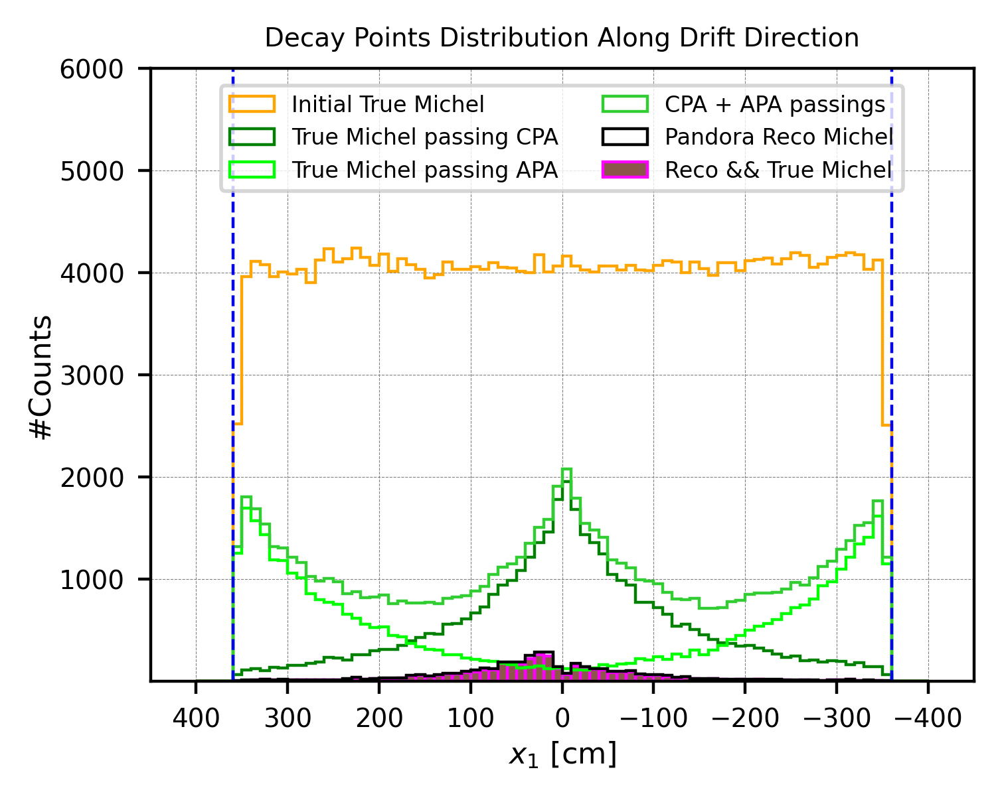

In [42]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

#Start drawing figures======================================    
#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


#Very Initial values:
vals_decayX_veryIni = [ev.decayX_initial for ev in events_veryIni]
vals_decayY_veryIni = [ev.decayY_initial for ev in events_veryIni]
vals_decayZ_veryIni = [ev.decayZ_initial for ev in events_veryIni]

print("Very Initial True Michel events:----------")
print("#events: ", len(events_veryIni))


#Initial true Michel with T0 tagging------
events_T0 = [ev for ev in events_veryIni if ev.passing_status > 0] # APA + CPA----
events_T0_CPA = [ev for ev in events_veryIni if ev.passing_status == 1] # CPA----
events_T0_APA = [ev for ev in events_veryIni if ev.passing_status == 2] # APA----

print("\n#events passing CPA: ", len(events_T0_CPA), "/", len(events_veryIni),
      "({:.2f}%)".format(len(events_T0_CPA)/len(events_veryIni)*100))
print("#events passing APA: ", len(events_T0_APA), "/", len(events_veryIni),
      "({:.2f}%)".format(len(events_T0_APA)/len(events_veryIni)*100))
print("#events with T0: ", len(events_T0), "/", len(events_veryIni),
      "({:.2f}%)".format(len(events_T0)/len(events_veryIni)*100))

vals_decayX_T0 = [ev.decayX_initial for ev in events_T0]
vals_decayX_T0_CPA = [ev.decayX_initial for ev in events_T0_CPA]
vals_decayX_T0_APA = [ev.decayX_initial for ev in events_T0_APA]

#Simple cut on events_reco (initial)----------------------------
events_reco_simpleCut = []
events_true_simpleCut = []
for ev in events_reco:
    dX = ev.decayX_initial
    dY = ev.decayY_initial
    dZ = ev.decayZ_initial
    MS = ev.MS_initial
    MH = ev.MH_initial
    E  = ev.energy_initial

    #Default region: 0<y<610, 0<z<465 (SPACE CUT)---
    if -356 < dX < 356 and 30 < dY < 580 and 30 < dZ < 435:    

        if 0.4 < MS: #(Michel score cut)---
            
            if 5 < MH: #Michel hits cut---                
                events_reco_simpleCut.append(ev)
                if E > 0:
                    events_true_simpleCut.append(ev) 

print("\nReco (TPC Cut) distribution:---------")
print("#Reco events (TPC cut)  : ", len(events_reco_simpleCut))

print("Efficiency (reco / true): ", len(events_reco_simpleCut), "/", len(events_veryIni),
      "({:.2f}%)".format(len(events_reco_simpleCut)/len(events_veryIni)*100))

print("Purity: ", len(events_true_simpleCut), "/", len(events_reco_simpleCut), 
      "({:.2f}%)".format(len(events_true_simpleCut)/len(events_reco_simpleCut)*100))

decayX_reco_SimpleCut = [ev.decayX_initial for ev in events_reco_simpleCut]
decayX_true_SimpleCut = [ev.decayX_initial for ev in events_true_simpleCut]

num_negX = len([ev for ev in events_reco_simpleCut if ev.decayX_initial < 0])
num_posX = len([ev for ev in events_reco_simpleCut if ev.decayX_initial >= 0])

print("\n# of X < 0 : ", num_negX, "({:.2f}%)".format(num_negX/len(events_reco_simpleCut)*100))
print("# of X >= 0: ", num_posX, "({:.2f}%)".format(num_posX/len(events_reco_simpleCut)*100))




# Plotting the histogram (X distribution)--------------------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(vals_decayX_veryIni, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='step', linewidth=0.8, label="Initial True Michel")
plt.hist(vals_decayX_T0_CPA, bins=bins, range=(range_min, range_max), edgecolor='green', 
         histtype='step', linewidth=0.8, label="True Michel passing CPA")
plt.hist(vals_decayX_T0_APA, bins=bins, range=(range_min, range_max), edgecolor='lime', 
         histtype='step', linewidth=0.8, label="True Michel passing APA")
plt.hist(vals_decayX_T0, bins=bins, range=(range_min, range_max), edgecolor='limegreen', 
         histtype='step', linewidth=0.8, label="CPA + APA passings")
plt.hist(decayX_reco_SimpleCut, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label="Pandora Reco Michel")
plt.hist(decayX_true_SimpleCut, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='bar', linewidth=0.8, label="Reco && True Michel")


#APA planes---
plt.plot([-360, -360], [0, 6000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 6000], color="blue", linewidth=0.8, linestyle='--')


plt.xlim(-450, 450)
plt.xlabel(r'$x_1$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.1, 6000)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 0.99), fontsize=9, markerscale=6, ncol=2, prop={'size': 6})

plt.show()  

